# 9주차_지능 에이전트

- Preview
- 지능 에이전트 시나리오
- 지능 에이전트 만들기
- 고급 인터페이스를 갖춘 지능 에이전트
- 지식 표현과 추론
- 틈새 없는 협동과 능동성을 갖춘 지능 에이전트

---

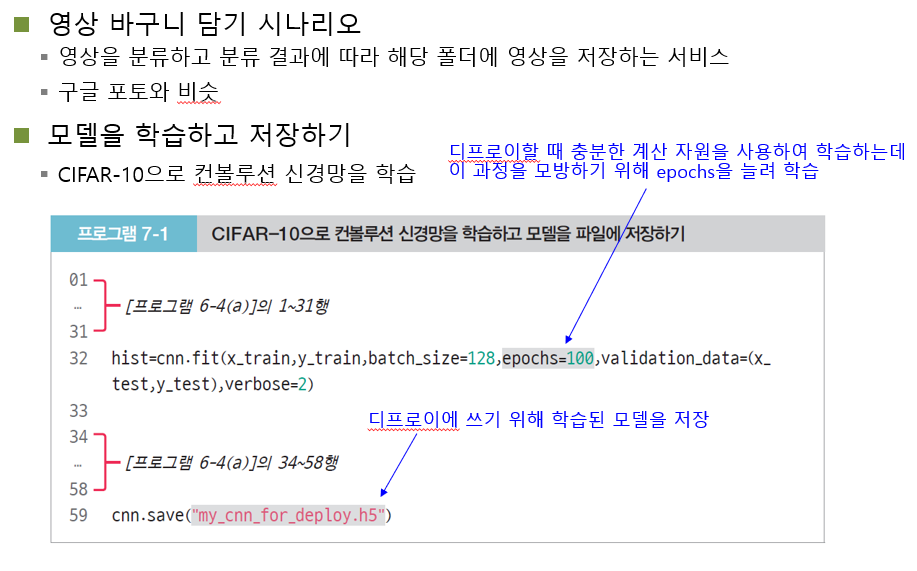

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 CIFAR-10 데이터셋을 기반으로 CNN(Convolutional Neural Network)을 설계하고,
# 이미지 분류 성능을 학습·평가·시각화·저장하는 전체 파이프라인을 포함함.
# 특히 이미지 정규화 및 라벨 원-핫 인코딩, 합성곱 기반의 피처 추출, 드롭아웃 기반의 과적합 방지 등
# 실전 모델 설계에 필수적인 요소들을 모두 포함함.
# ------------------------------------------------------------

# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: CIFAR-10 데이터셋 로드 및 전처리 (정규화 + 원-핫 인코딩)
# 2단계: CNN 모델 설계 (다중 Conv + MaxPool + Dropout + FC 구성)
# 3단계: 컴파일 및 학습 수행 (categorical crossentropy 손실 + Adam 옵티마이저)
# 4단계: 테스트셋에 대한 성능 평가 (정확률 출력)
# 5단계: 학습 곡선 시각화 (정확률 및 손실)
# 6단계: 학습된 모델 저장 (.h5 형식으로 배포 가능)
# ------------------------------------------------------------

import numpy as np  
# 배열 기반의 고속 수치 연산을 위한 모듈로, 이미지 정규화 등 데이터 처리에 필수임
import tensorflow as tf  
# 딥러닝 모델 설계, 학습, 평가, 시각화 등 전체 워크플로우를 지원하는 프레임워크
from tensorflow.keras.datasets import cifar10  
# CIFAR-10은 32x32x3 이미지로 구성된 10개 클래스의 대표적인 이미지 분류 데이터셋
from tensorflow.keras.models import Sequential  
# 모델을 계층적으로 쌓는 방식의 구조를 제공하는 클래스
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout  
# CNN 모델을 구성하는 필수 레이어들
from tensorflow.keras.optimizers import Adam  
# 학습률을 자동으로 조정하는 옵티마이저로, 초기 학습 및 수렴 안정성 확보에 유리함

# ------------------------------------------------------------
# [1단계] CIFAR-10 데이터셋 로드 및 전처리
# ------------------------------------------------------------

(x_train, y_train), (x_test, y_test) = cifar10.load_data()  
# 훈련/테스트용 이미지와 라벨을 불러오는 과정
# 총 60,000장의 32x32 RGB 이미지 중 50,000장은 학습용, 10,000장은 테스트용으로 구성됨

x_train = x_train.astype(np.float32) / 255.0  
# 픽셀 값을 0~255에서 0~1 사이의 실수형으로 정규화
# 정규화를 통해 신경망의 가중치 갱신이 안정적으로 이루어지도록 유도함
# 특히 ReLU나 sigmoid 계열 활성화 함수에서는 입력 분포의 스케일이 성능에 큰 영향을 미침

x_test = x_test.astype(np.float32) / 255.0  
# 테스트 데이터에도 동일한 정규화를 적용하여 훈련 데이터와 분포 일치 유도

y_train = tf.keras.utils.to_categorical(y_train, 10)  
# 정수형 클래스 레이블을 One-hot 벡터로 변환
# softmax 출력 계층과 categorical_crossentropy 손실 함수 사용 시 필수 전처리
# 각 클래스의 확률 분포 형태로 예측값을 출력하기 위함

y_test = tf.keras.utils.to_categorical(y_test, 10)  
# 테스트 데이터 라벨에도 동일한 변환 수행
# 평가 시 예측된 확률 벡터와 정답 벡터 간의 정확률 계산이 가능해짐

# ------------------------------------------------------------
# [2단계] CNN 모델 설계
# ------------------------------------------------------------

cnn = Sequential()  
# 계층을 순차적으로 쌓는 방식의 모델 객체 생성
# 입력 → 은닉층 → 출력층 순으로 직관적으로 구성 가능

cnn.add(Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)))  
# 3x3 크기의 필터 32개를 사용한 합성곱 계층 추가
# 입력 이미지의 저수준 패턴(모서리, 색 변화 등)을 감지하기 위한 초기 특징 추출 목적
# ReLU 활성화 함수는 비선형성을 부여하여 표현력을 증가시키며, 기울기 소실 문제 완화에 효과적임

cnn.add(Conv2D(32, (3, 3), activation='relu'))  
# 두 번째 합성곱 계층 추가로 필터를 중첩 적용하여 더 정교한 특징 감지 가능
# 필터 중첩을 통해 모델이 비선형적이고 추상적인 패턴을 점진적으로 학습하도록 유도함

cnn.add(MaxPooling2D(pool_size=(2, 2)))  
# 2x2 영역에서 가장 큰 값을 선택하여 다운샘플링 수행
# 위치 불변성(translation invariance) 확보 및 파라미터 수 감소를 통한 과적합 방지 목적

cnn.add(Dropout(0.25))  
# 훈련 중 무작위로 뉴런의 출력을 25% 비활성화함
# 과적합 방지를 위한 정규화 기법으로, 네트워크의 일반화 능력을 향상시킴

cnn.add(Conv2D(64, (3, 3), activation='relu'))  
# 필터 수를 64개로 증가시켜 보다 복잡한 중간 수준 특징(윤곽, 물체의 구성요소 등) 학습 유도

cnn.add(Conv2D(64, (3, 3), activation='relu'))  
# 동일 구조 반복을 통해 깊은 계층에서도 복잡한 패턴 인식 가능하게 함
# 신경망 깊이를 증가시켜 표현력 강화 및 데이터 적응력 증대

cnn.add(MaxPooling2D(pool_size=(2, 2)))  
# 또 한 번의 풀링을 통해 특징 맵의 크기를 축소하고, 필터의 receptive field를 확장함

cnn.add(Dropout(0.25))  
# 두 번째 드롭아웃 계층으로 추가적인 과적합 방지 효과 유도

cnn.add(Flatten())  
# 다차원 특징맵을 1차원 벡터로 변환하여 Dense 계층과 연결 가능하게 함

cnn.add(Dense(512, activation='relu'))  
# 512개의 뉴런을 가진 완전 연결 계층
# 앞 단계에서 추출한 특징들을 종합하여 의사결정에 필요한 고차원 표현을 학습하는 단계

cnn.add(Dropout(0.5))  
# 50% 확률의 드롭아웃 적용으로 더욱 강력한 일반화 효과 부여
# 학습된 특징이 특정 뉴런에 과도하게 의존하는 현상을 방지함

cnn.add(Dense(10, activation='softmax'))  
# 클래스 수에 맞는 10개의 출력 노드를 가진 최종 출력층
# softmax 함수를 통해 각 클래스에 대한 확률 분포 출력

# ------------------------------------------------------------
# [3단계] 모델 컴파일 및 학습 수행
# ------------------------------------------------------------

cnn.compile(loss='categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])  
# 다중 클래스 분류 문제에 적합한 손실 함수 및 성능 지표 설정
# Adam 옵티마이저는 SGD보다 빠른 수렴을 유도하며, 학습률 튜닝 없이도 성능이 안정적으로 나옴

hist = cnn.fit(x_train, y_train, batch_size=128, epochs=100,  
               validation_data=(x_test, y_test), verbose=2)  
# 미니배치 학습 수행: 배치 사이즈 128, 총 100에폭 반복
# 에폭마다 검증 데이터로 과적합 여부를 모니터링함
# verbose=2는 에폭별 진행률만 간단히 출력

# ------------------------------------------------------------
# [4단계] 모델 평가
# ------------------------------------------------------------

res = cnn.evaluate(x_test, y_test, verbose=0)  
# 테스트셋에 대한 최종 성능 평가 수행
# 손실값과 정확률을 반환하며, 여기서는 정확률만 출력에 사용함

print("정확률은", res[1] * 100)  
# 테스트셋에서의 분류 정확률을 백분율로 변환하여 출력
# res[0]	손실 함수(loss) 값
# res[1]	평가 지표(metric), 보통 accuracy 값
# ------------------------------------------------------------
# [5단계] 학습 곡선 시각화
# ------------------------------------------------------------

import matplotlib.pyplot as plt  # 시각화를 위한 matplotlib 라이브러리 임포트

plt.plot(hist.history['accuracy'])  # 학습 정확률 변화 곡선 시각화
plt.plot(hist.history['val_accuracy'])  # 검증 정확률 변화 곡선 시각화
plt.title('Model accuracy')  # 그래프 제목 설정
plt.ylabel('Accuracy')  # y축 이름 지정
plt.xlabel('Epoch')  # x축 이름 지정
plt.legend(['Train', 'Validation'], loc='best')  # 범례 추가
plt.grid()  # 격자선 표시로 그래프 해석 용이화
plt.show()  # 정확률 그래프 출력

plt.plot(hist.history['loss'])  # 학습 손실 변화 시각화
plt.plot(hist.history['val_loss'])  # 검증 손실 변화 시각화
plt.title('Model loss')  # 제목 설정
plt.ylabel('Loss')  # y축 이름
plt.xlabel('Epoch')  # x축 이름
plt.legend(['Train', 'Validation'], loc='best')  # 범례 설정
plt.grid()  # 그래프 가독성 향상을 위한 격자 표시
plt.show()  # 손실 곡선 그래프 출력

# ------------------------------------------------------------
# [6단계] 모델 저장
# ------------------------------------------------------------

cnn.save("my_cnn_for_deploy.h5")  
# 학습이 완료된 모델을 HDF5 형식으로 저장함
# 추후 배포, 재사용, 서빙 등에 활용 가능함


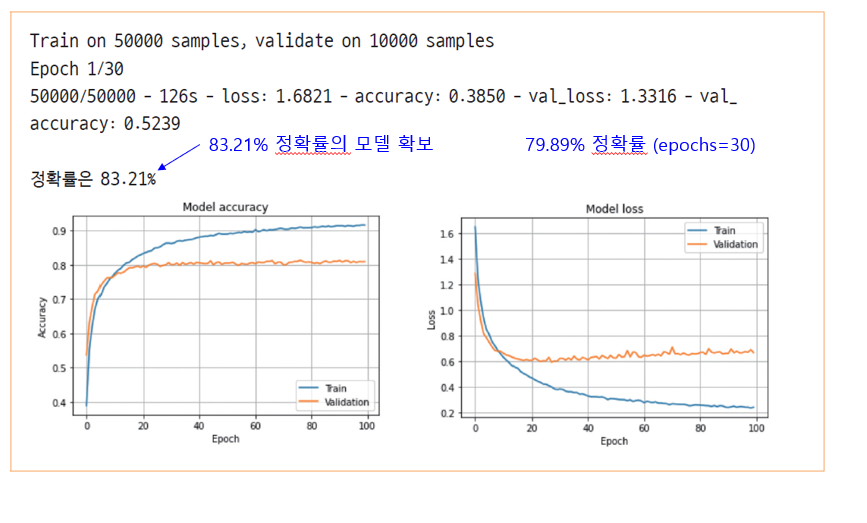

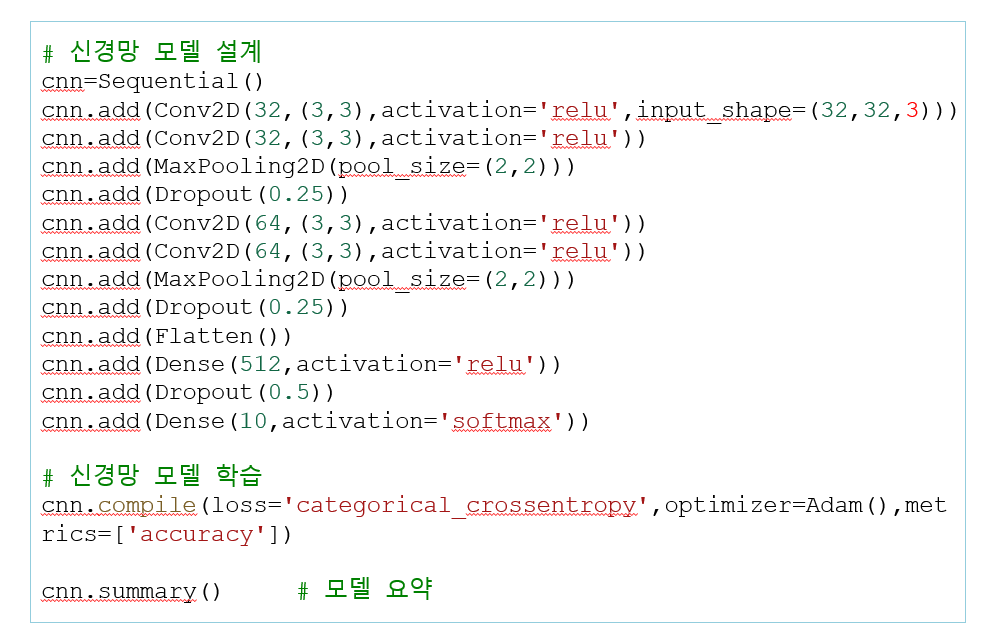

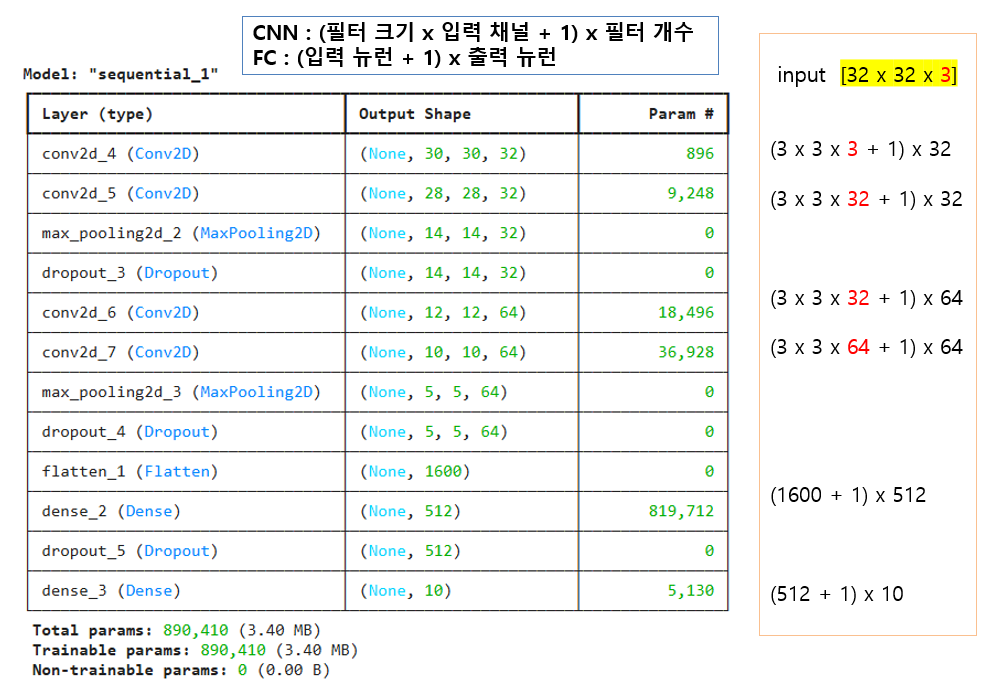
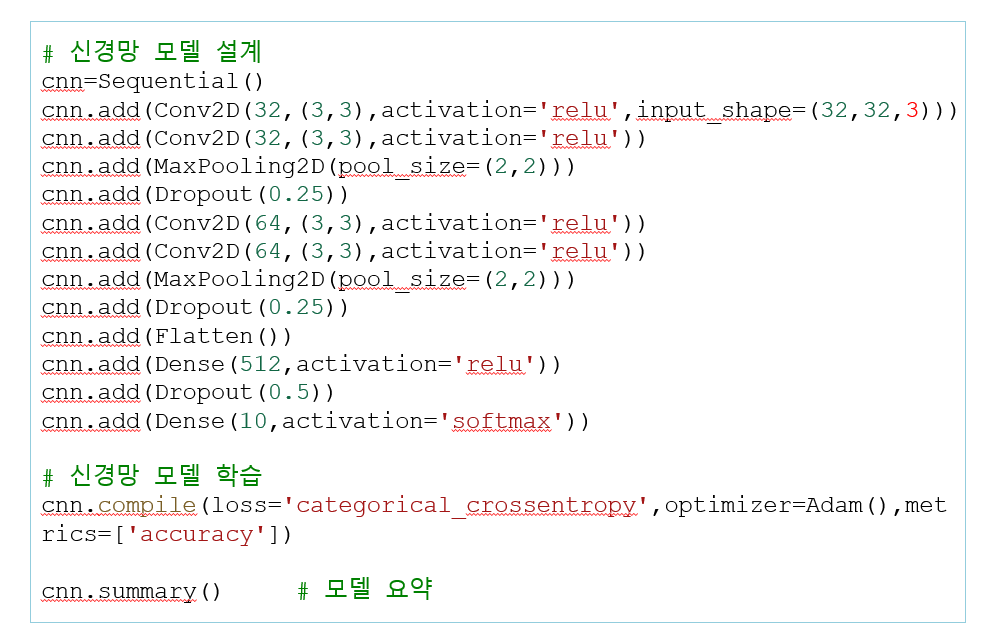

---

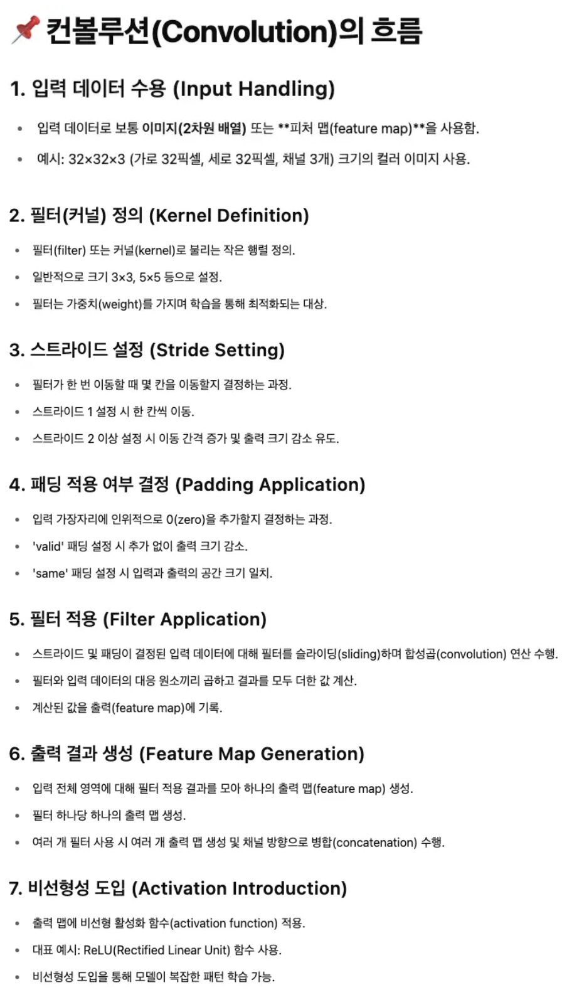

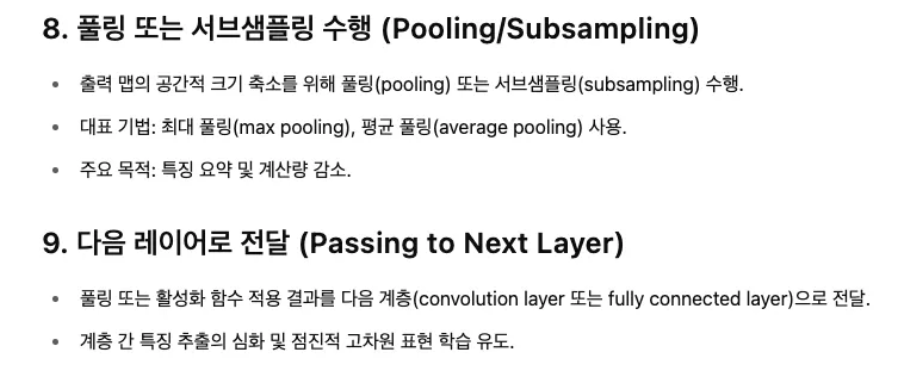

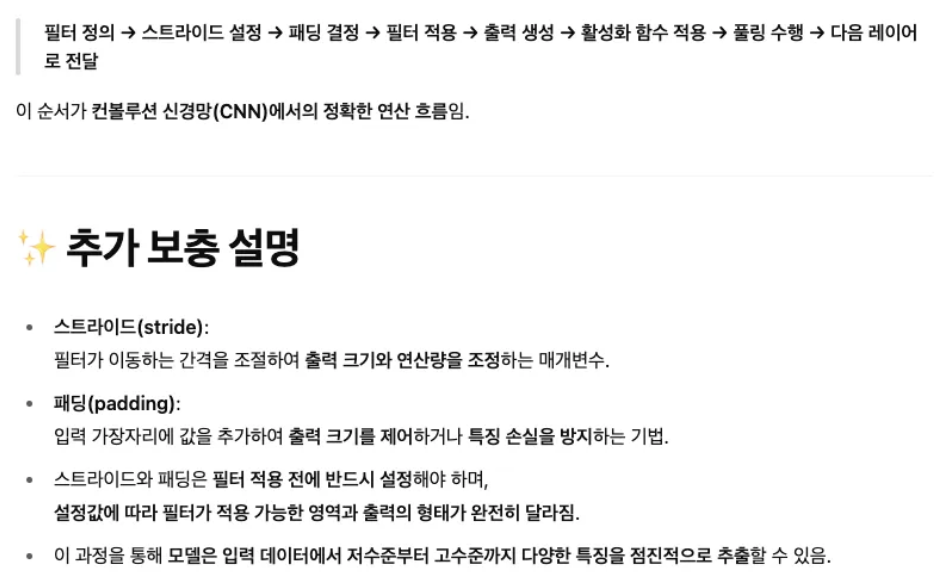

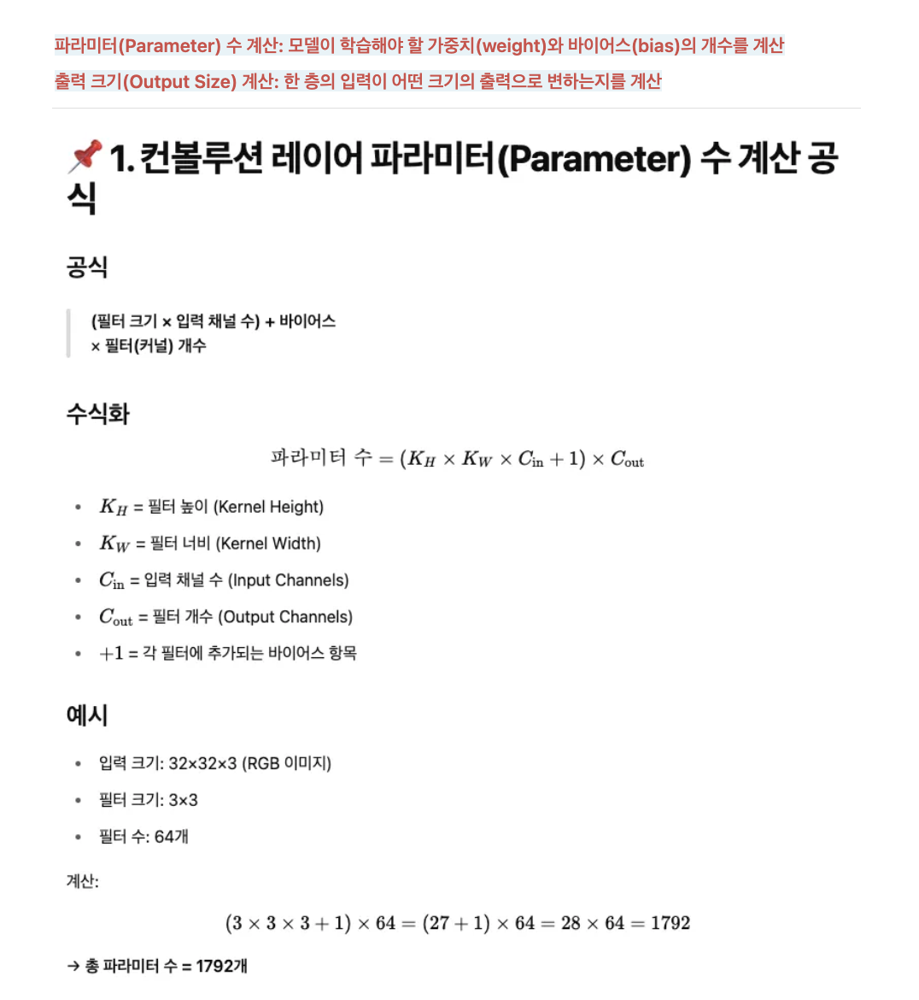

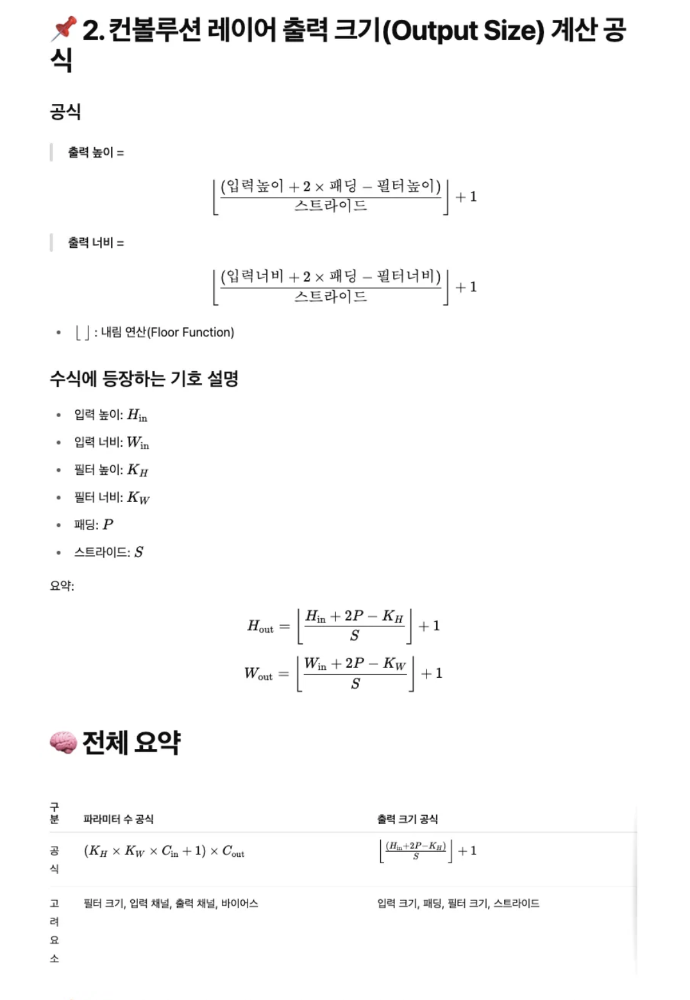

...

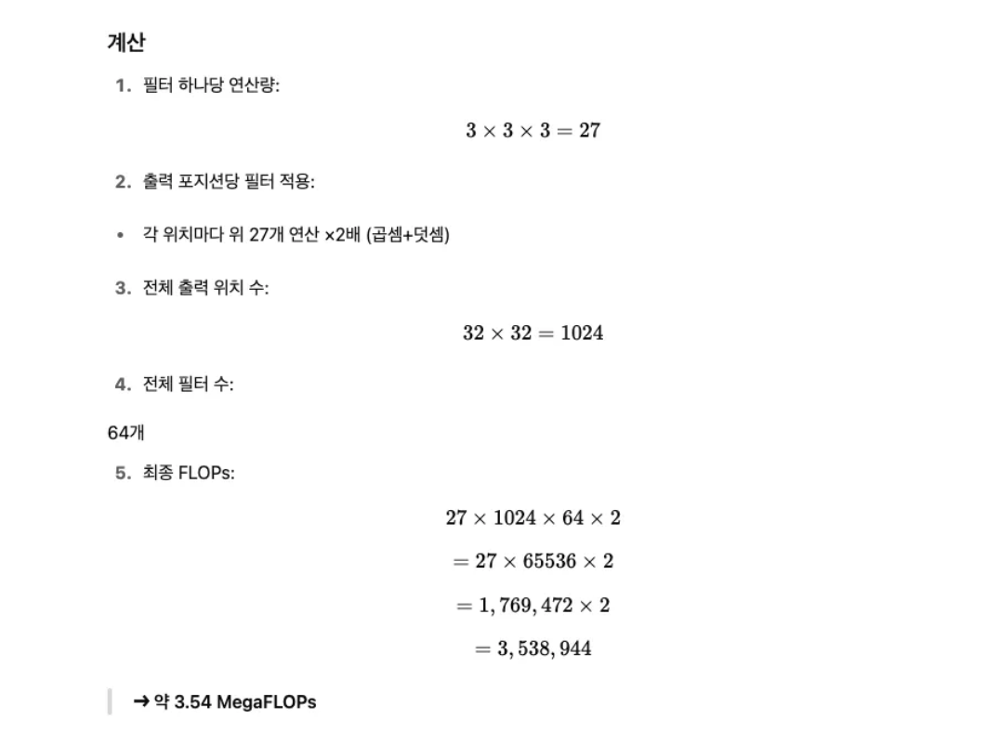

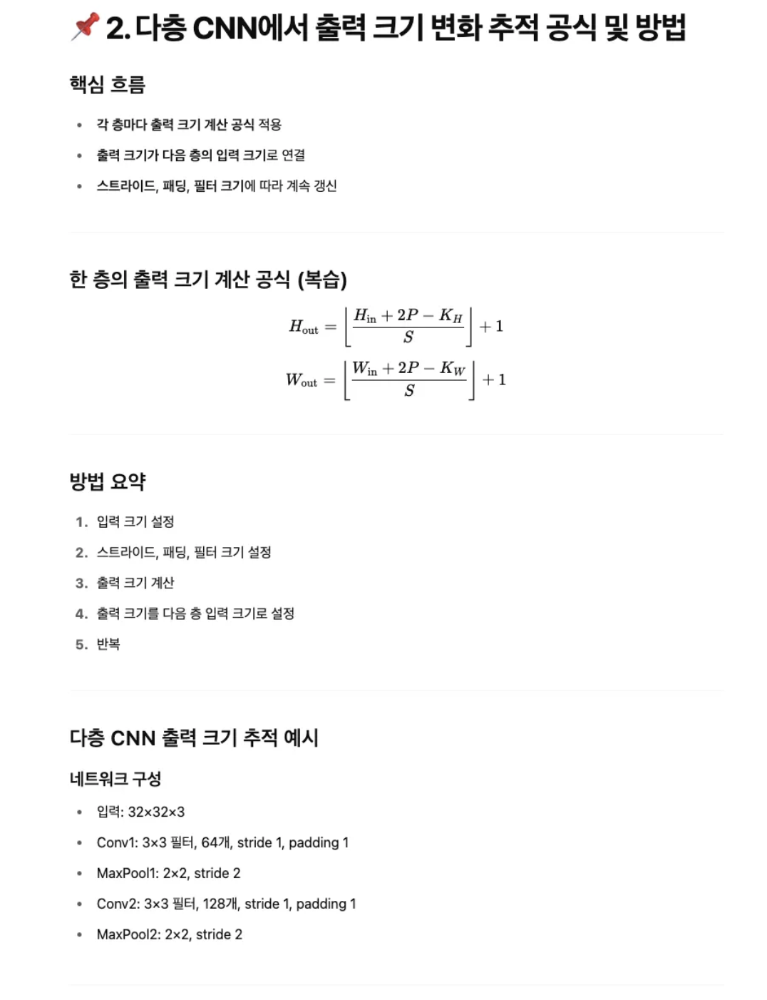

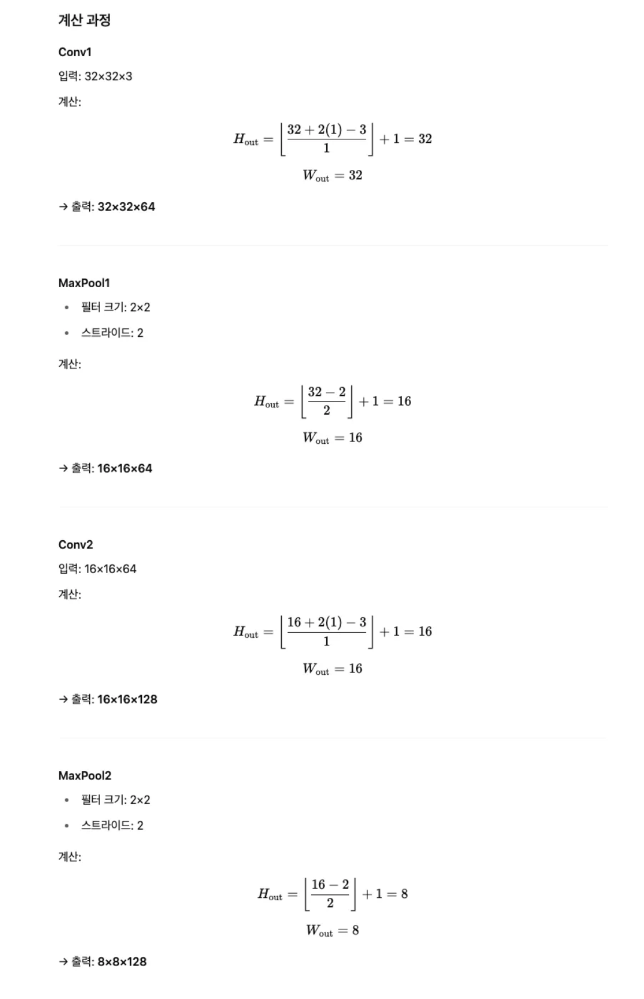

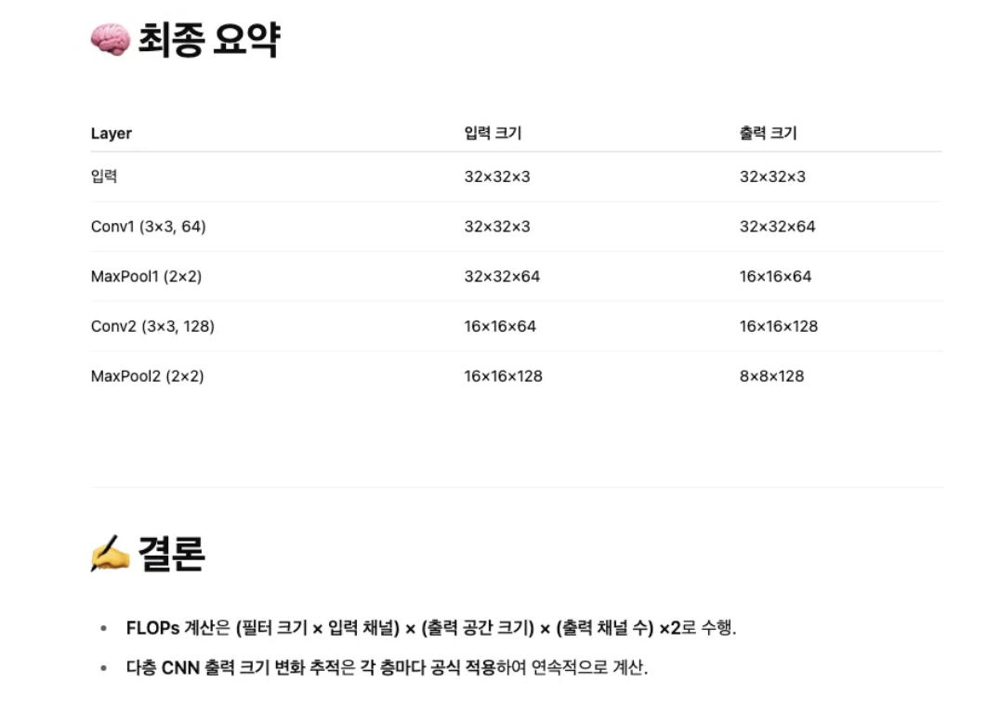

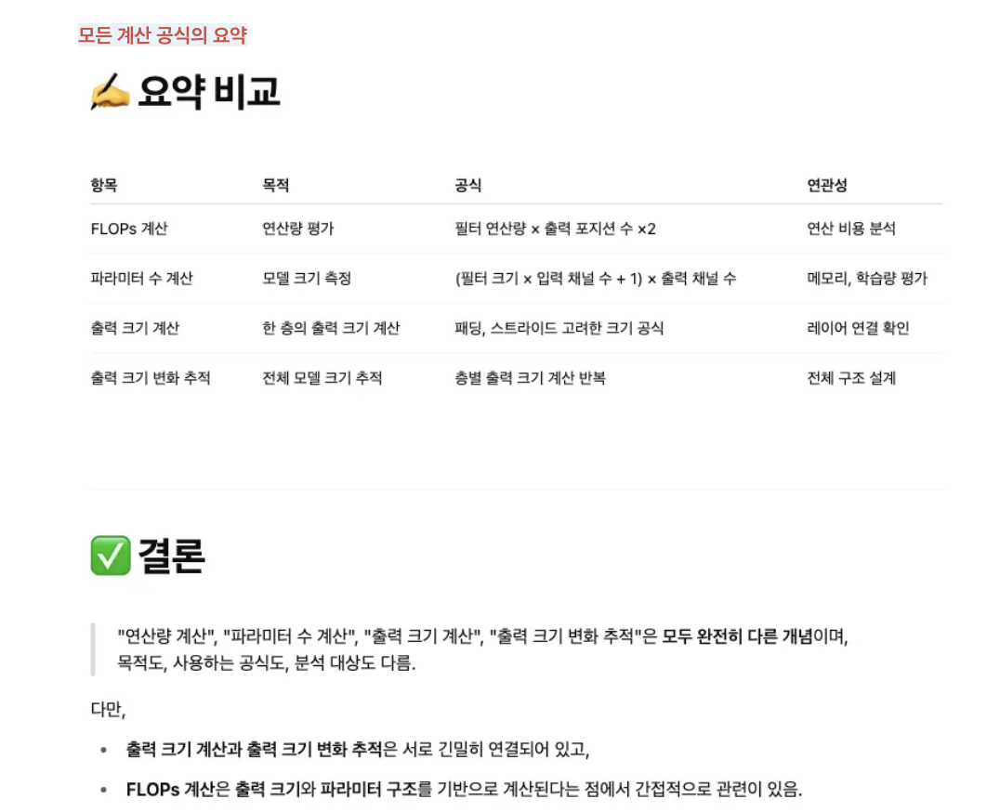

---

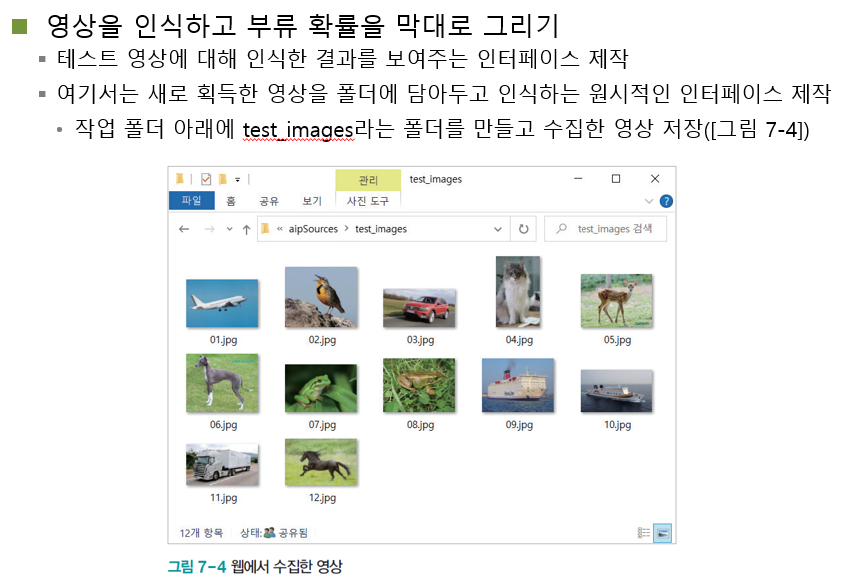

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 학습이 완료된 CNN 모델(my_cnn_for_deploy.h5)을 외부에서 불러와
# 지정된 폴더(test_images)에 있는 사용자 테스트 이미지를 입력으로 받아 예측을 수행하고,
# 각 이미지에 대한 예측 확률 분포를 수평 막대 그래프로 시각화하는 데모임.
# 모델은 CIFAR-10 데이터셋 기반으로 학습되었으며, 총 10개의 클래스에 대해 분류를 수행함.

# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: 라이브러리 임포트 (TensorFlow, PIL, matplotlib 등)
# 2단계: 학습된 CNN 모델 로드 (.h5 파일)
# 3단계: CIFAR-10 클래스 이름 정의
# 4단계: 외부 이미지 폴더 순회 후 이미지 전처리 (크기 조정, 정규화)
# 5단계: 모델 추론 수행 및 결과 출력
# 6단계: 이미지 및 클래스별 예측 확률을 함께 시각화
# ------------------------------------------------------------

import numpy as np  
# 이미지 배열 생성, 정규화, 벡터 연산 등을 처리하기 위한 수치 계산 라이브러리 임포트
import tensorflow as tf  
# 학습된 모델 로드 및 추론 처리를 위한 TensorFlow 프레임워크 임포트
from PIL import Image  
# 외부 이미지 파일을 열고 크기를 조정하기 위한 Python Imaging Library 임포트
import os  
# 디렉토리 내 파일 목록 탐색 및 경로 연결을 위한 운영체제 인터페이스 모듈 임포트

cnn = tf.keras.models.load_model("my_cnn_for_deploy.h5")  
# 학습이 완료된 CNN 모델 구조와 가중치를 함께 포함한 .h5 모델 파일 로드 수행
# 학습된 모델을 추론용으로 재사용함으로써 학습 없이 직접 예측을 실행할 수 있도록 준비함
# 모델은 32x32 RGB 이미지를 입력으로 받아 10개 클래스를 softmax로 출력하는 구조로 학습됨

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 
               'dog', 'flog', 'horse', 'ship', 'truck']  
# CIFAR-10에서 사용하는 클래스 이름을 문자열로 저장한 리스트 정의
# 모델 출력값(softmax 확률 벡터)의 인덱스를 사람이 이해 가능한 클래스 이름으로 매핑하기 위한 용도임
# 시각화 시 예측 결과를 텍스트로 표현하기 위한 기준 라벨로 사용됨

x_test = []  
# 테스트 이미지 데이터를 저장할 리스트 객체 초기화
# 외부 폴더 내에서 반복적으로 이미지를 읽어 리스트에 축적하는 용도임

for filename in os.listdir("./test_images"):  
    # test_images 폴더 내의 모든 파일명을 하나씩 반복 탐색하는 for문 정의
    # os.listdir 함수는 파일명 리스트를 반환함
    # 추론 대상 이미지가 포함된 디렉토리를 지정하고 해당 디렉토리의 이미지만 선택적으로 로드하기 위함

    if 'jpg' not in filename:  
        continue  
        # 파일 확장자에 'jpg'가 포함되지 않으면 해당 파일은 무시하고 다음 반복으로 진행
        # 이미지 외의 파일이 혼합되어 있는 경우의 오류 방지를 위한 예외 처리 구문

    img = Image.open("./test_images/" + filename)  
    # 현재 파일명을 이용해 전체 경로를 구성하고 이미지를 열어 PIL 이미지 객체로 변환
    # 파일 경로와 이름을 문자열로 결합하여 해당 경로에 있는 이미지를 로드함

    x = np.asarray(img.resize([32, 32])) / 255.0  
    # 로드된 이미지를 CIFAR-10의 입력 규격(32x32)으로 크기 조정함
    # 이후 np.asarray로 PIL 이미지를 numpy 배열로 변환하고, 각 픽셀값을 0~1 사이로 정규화함
    # 모델 입력 형태에 맞추기 위한 전처리 과정으로, 픽셀 정규화는 수렴 안정성과 성능 향상에 기여함

    x_test.append(x)  
    # 전처리된 이미지 배열을 테스트 이미지 리스트에 추가함
    # 반복적으로 처리하여 x_test에 전체 테스트 이미지를 축적함

x_test = np.asarray(x_test)  
# 리스트로 저장된 이미지들을 numpy 배열로 변환함
# 모델 입력 요구 형식은 4차원 텐서(N, 32, 32, 3)이므로 리스트를 배열로 변환하여 배치 단위로 처리 가능하게 함

pred = cnn.predict(x_test)  
# 학습된 CNN 모델에 전처리된 이미지 데이터를 입력하여 예측 수행
# 출력 결과는 각 이미지에 대해 10개 클래스의 softmax 확률을 반환함
# 각 벡터의 원소는 해당 클래스일 확률을 의미하며, 가장 높은 값을 가진 인덱스가 예측 클래스가 됨

print(pred)  
# 예측된 확률 벡터를 출력함
# 각 행이 하나의 이미지에 대한 softmax 결과이며, 10개의 실수값(0~1)을 포함함
# 값이 높은 클래스가 모델이 판단한 해당 이미지의 예측 결과임을 의미함

import matplotlib.pyplot as plt  # 예측 결과 시각화를 위한 matplotlib 라이브러리 임포트

n = len(x_test)  
# 전체 테스트 이미지 수를 n 변수에 저장함
# 반복문 및 subplot 구성에서 이미지 개수를 기준으로 처리하기 위함

plt.figure(figsize=(18, 4))  
# 전체 그래프 도화지 크기를 설정함
# 넓은 가로 폭을 설정하여 이미지와 예측 그래프가 겹치지 않고 보기 좋게 배열되도록 함

for i in range(n):  
    # 모든 테스트 이미지에 대해 시각화를 수행하기 위한 반복문 구성

    plt.subplot(2, n, i + 1)
    # plt.subplot(행, 열, 인덱스)  
    # 위쪽 서브플롯 행(1행)에서 i번째 이미지가 출력될 위치 지정
    # subplot의 인덱스는 1부터 시작하므로 i+1로 설정함

    plt.imshow(x_test[i])  
    # 전처리된 이미지 배열을 실제 이미지로 출력함
    # RGB 채널 정보를 유지하므로 시각적으로 원본에 가까운 형태로 출력됨

    plt.xticks([]); plt.yticks([])  
    # x축과 y축의 눈금을 제거하여 이미지 영역이 깔끔하게 출력되도록 처리함

    plt.subplot(2, n, n + i + 1)  
    # 아래쪽 서브플롯 행(2행)에서 해당 이미지의 예측 확률 막대 그래프를 그릴 위치 지정
    # 전체 subplot 수가 2n이므로 n+i+1번째가 하단 대응 영역이 됨

    if i == 0:  
        plt.barh(class_names, pred[i])  
        # 첫 번째 이미지는 클래스 이름을 그대로 사용하여 수평 막대 그래프 생성
        # 클래스 레이블이 명확하게 표시되어 어떤 클래스에 확률이 높은지 직관적으로 확인 가능함
    else:  
        plt.barh(['a','A','b','c','d','D','f','h','s','t'], pred[i])  
        # 나머지 이미지는 축 이름을 간략화한 버전으로 표기
        # 동일한 크기의 subplot을 유지하면서 시각적 정보 중복을 줄이기 위함

    plt.xticks([])  
    # 수평 막대 그래프의 x축 눈금을 제거하여 그래프 해석을 간단하게 함


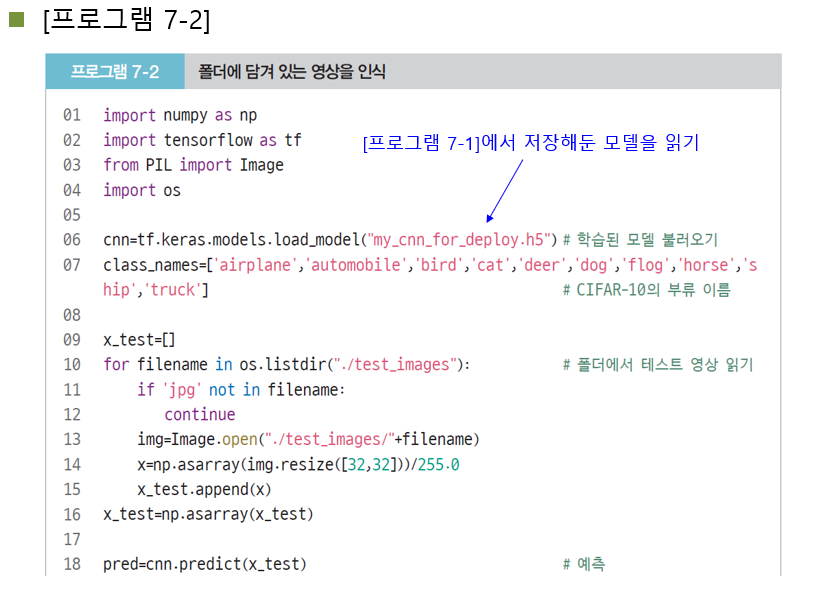

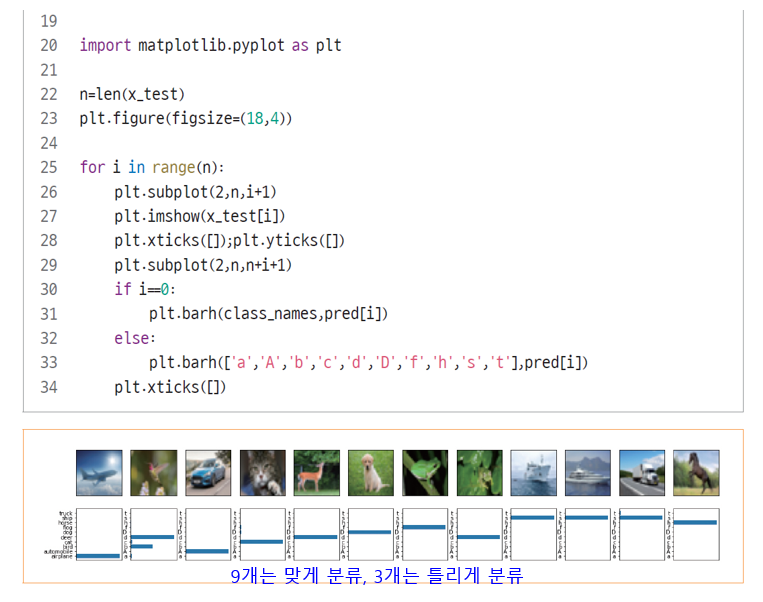

---

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 학습이 완료된 CNN 모델(my_cnn_for_deploy.h5)을 로드한 후,
# test_images 폴더 내의 외부 테스트 이미지를 읽고 CIFAR-10 클래스 중 하나로 분류함.
# 추론 결과에 따라 이미지를 클래스 이름별로 자동 분류하여 class_buckets 디렉토리 내부의
# 하위 폴더에 저장하는 전처리-추론-후처리 자동화 파이프라인임.

# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: 필수 라이브러리 임포트 (numpy, tensorflow, PIL, os)
# 2단계: 학습된 CNN 모델 로드 및 클래스 이름 정의
# 3단계: 테스트 이미지 불러오기 및 전처리 수행 (크기 조정, 정규화)
# 4단계: 모델을 통한 추론 실행
# 5단계: class_buckets 폴더 및 각 클래스별 하위 폴더 생성
# 6단계: 예측 결과에 따라 이미지를 분류된 폴더에 저장
# ------------------------------------------------------------

import numpy as np  # 수치 계산 및 이미지 배열 처리를 위한 numpy 모듈 임포트
import tensorflow as tf  # 학습된 딥러닝 모델을 로드하고 추론을 수행하기 위한 TensorFlow 모듈 임포트
from PIL import Image  # 이미지 불러오기 및 리사이징 처리를 위한 PIL 라이브러리 임포트
import os  # 디렉토리 탐색 및 폴더 생성 등 파일 시스템 접근을 위한 운영체제 모듈 임포트

cnn = tf.keras.models.load_model('../../main/source_3/ch7/my_cnn_for_deploy.h5')  
# 학습이 완료된 CNN 모델 파일(.h5)을 메모리로 불러오는 작업 수행
# 내부적으로 모델 구조와 가중치 정보를 포함하고 있어 추가 학습 없이 즉시 추론 가능함

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 
               'dog', 'flog', 'horse', 'ship', 'truck']  
# CIFAR-10 데이터셋의 10개 클래스에 대응되는 문자열 리스트 정의
# 추론 결과의 softmax 벡터 인덱스를 사람이 이해할 수 있는 클래스명으로 해석하기 위한 기준임

x_test = []  # 모델에 입력될 정규화된 이미지 배열을 저장할 리스트 선언
img_orig = []  # 원본 PIL 이미지 객체를 저장하여 저장 시 다시 활용하기 위한 리스트 선언
fname = []  # 원본 파일 이름을 저장하여 나중에 재저장 시 원본 이름을 보존하기 위한 리스트 선언

for filename in os.listdir('../../main/source_3/ch7/test_images'):  
    # test_images 폴더 내 모든 파일명을 순회하는 반복문 정의
    # 외부에서 수집한 테스트 이미지들을 자동으로 처리하는 루프 구성

    if 'jpg' not in filename:  
        continue  
        # 파일명에 'jpg'가 포함되어 있지 않은 경우는 이미지가 아니라고 판단하고 무시함
        # 데이터 폴더 내 비이미지 파일 또는 잘못된 확장자를 걸러내기 위한 예외 처리 구문임

    img = Image.open('../../main/source_3/ch7/test_images/' + filename)  
    # PIL을 사용하여 해당 파일을 이미지 객체로 로드함
    # RGB 형식의 컬러 이미지가 기본이며 이후 리사이징 및 정규화 전처리 수행 가능함

    img_orig.append(img)  
    # 로드한 원본 이미지 객체를 img_orig 리스트에 저장함
    # 추론 이후 결과 폴더에 재저장할 때 원본 상태로 저장하기 위한 목적임

    fname.append(filename)  
    # 원본 이미지의 파일명을 리스트에 저장함
    # 분류 후 저장할 때 동일한 이름을 사용하여 추적성을 유지하기 위한 목적임

    x = np.asarray(img.resize([32, 32])) / 255.0  
    # 이미지를 CIFAR-10 입력 크기인 32x32로 리사이징한 후 numpy 배열로 변환하고 정규화 수행
    # 모델 입력값으로 사용하기 위해 픽셀 값을 0~1 범위로 스케일링함
    # 학습 당시 입력 조건과 동일하게 맞춰야 모델이 정확한 추론을 수행할 수 있음

    x_test.append(x)  
    # 전처리된 이미지 배열을 테스트 이미지 리스트에 추가하여 추후 모델 입력으로 사용함

x_test = np.asarray(x_test)  
# 리스트에 저장된 전처리 이미지들을 numpy 배열로 변환함
# CNN 모델 입력 형태인 4차원 텐서(N, 32, 32, 3)로 구성하기 위한 작업임

pred = cnn.predict(x_test)  
# 전처리된 테스트 이미지들을 CNN 모델에 입력하여 클래스 확률 벡터를 예측함
# 각 이미지에 대해 softmax 함수가 적용된 10개의 클래스별 확률값이 출력됨
# np.argmax로 가장 확률이 높은 인덱스를 찾아 최종 분류 클래스 결정 가능함

os.chdir('../../main/source_3/ch7/test_images')  
# 현재 작업 디렉토리를 test_images 폴더로 변경함
# 이후 생성할 폴더(class_buckets)를 해당 위치에 만들기 위함

if not os.path.isdir('class_buckets'):  
    os.mkdir('class_buckets')  
    # class_buckets 폴더가 존재하지 않을 경우 새로 생성함
    # 예측된 클래스를 기준으로 이미지를 저장할 상위 폴더로 사용됨

os.chdir('class_buckets')  
# 작업 디렉토리를 class_buckets 폴더 내부로 변경함
# 이후 각 클래스별 하위 폴더를 이 경로에 생성할 수 있도록 설정함

for i in range(len(class_names)):  
    # CIFAR-10의 각 클래스에 대해 반복문을 수행함
    # 총 10개 클래스 이름을 기반으로 각기 다른 폴더를 생성함

    if not os.path.isdir(class_names[i]):  
        os.mkdir(class_names[i])  
        # 해당 클래스 이름의 하위 폴더가 존재하지 않으면 새로 생성함
        # 예측 결과에 따라 이미지를 저장할 목적지 디렉토리 구조를 사전 구성함

for i in range(len(x_test)):  
    # 모든 테스트 이미지에 대해 반복문을 수행함
    # 각 이미지에 대해 예측 결과를 바탕으로 저장 폴더를 결정하고 이미지 저장 작업을 수행함

    folder_name = class_names[np.argmax(pred[i])]  
    # softmax 벡터 중 가장 높은 확률을 가진 인덱스를 찾고 해당 클래스명을 가져옴
    # 모델이 분류한 결과에 해당하는 클래스 이름을 폴더명으로 지정함

    os.chdir(folder_name)  
    # 해당 클래스에 대응되는 폴더로 이동하여 이미지 저장 작업을 준비함

    img_orig[i].save(fname[i])  
    # 저장할 이미지 파일을 PIL 객체 상태 그대로 저장함
    # 저장 파일명은 원본과 동일하게 유지하여 추적성과 일관성을 확보함

    os.chdir('..')  
    # 상위 폴더(class_buckets)로 다시 이동하여 다음 저장 대상 폴더 접근을 준비함


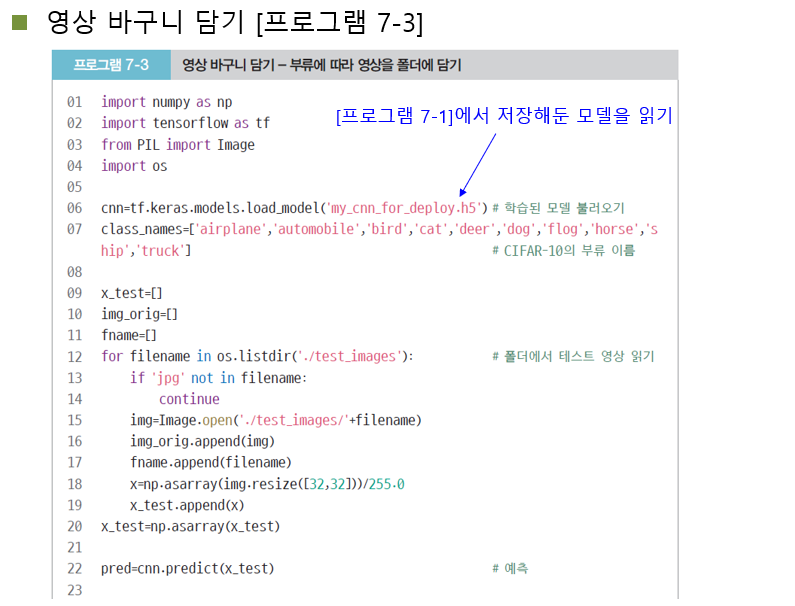

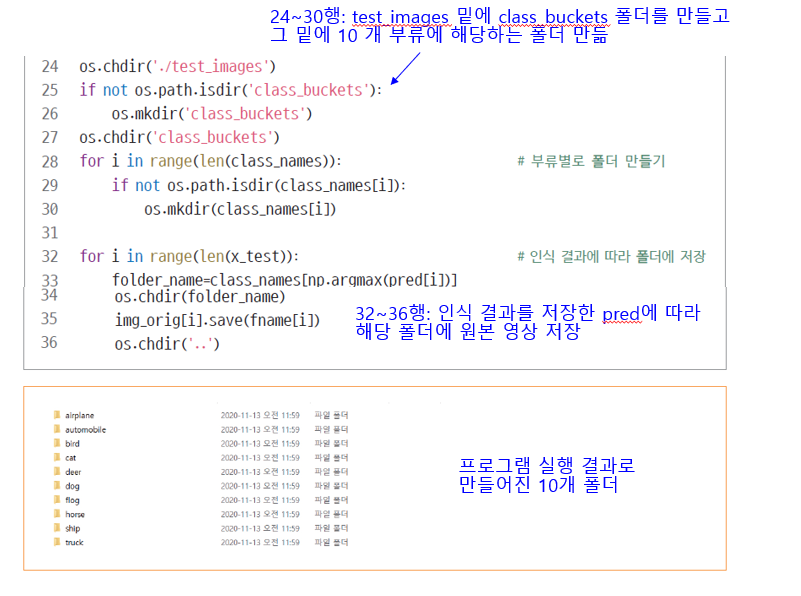

---

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 학습된 CIFAR-10 분류 모델을 활용하여 사용자가 선택한 이미지를 분류하고,
# 분류 결과를 영어, 프랑스어, 독일어로 번역 및 표시하며,
# 각 언어로 음성 출력 기능도 제공하는 교육용 GUI 어플리케이션임.
# Tkinter로 GUI 구성, PIL로 이미지 처리, gTTS 및 playsound로 TTS 출력, winsound로 효과음 출력함.
# ------------------------------------------------------------

# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: 필요한 라이브러리 임포트
# 2단계: 학습된 CNN 모델 및 다국어 클래스 이름 정의
# 3단계: 이미지 처리 및 예측 함수 정의
# 4단계: 다국어 음성 출력 함수 정의
# 5단계: 프로그램 종료 함수 정의
# 6단계: GUI 구성 요소 생성
# 7단계: GUI 구성 요소 배치
# 8단계: 이벤트 루프 실행
# ------------------------------------------------------------

# ==============================
# 1단계: 필요한 라이브러리 임포트
# ==============================

import numpy as np  
# 이미지 데이터 처리를 위한 수치 계산 라이브러리 numpy 임포트
import tensorflow as tf  
# 학습된 모델을 불러오고 예측을 수행하기 위한 텐서플로우 임포트
import tkinter as tk  
# GUI 구성용 기본 라이브러리인 tkinter 임포트
from tkinter import filedialog 
# 파일 선택 다이얼로그 호출을 위한 모듈 임포트
from PIL import Image, ImageTk  
# 이미지 로딩 및 Tkinter 호환 처리를 위한 PIL 모듈 임포트
import winsound  
# 효과음 출력을 위한 윈도우 전용 winsound 모듈 임포트
from gtts import gTTS  
# 텍스트를 음성으로 변환하는 Google TTS 라이브러리 임포트
import playsound  
# mp3 파일을 재생하는 모듈 임포트
import os  
# 파일 존재 여부 확인 및 삭제를 위한 os 모듈 임포트

# ==============================
# 2단계: 모델 및 클래스 이름 정의
# ==============================

cnn = tf.keras.models.load_model("my_cnn_for_deploy.h5")
# 사전 학습된 CIFAR-10 분류 모델(.h5 포맷)을 메모리로 불러옴

class_names_en = [
    'airplane','automobile','bird','cat',
    'deer','dog','frog','horse','ship','truck'
    ]
# CIFAR-10 클래스 이름 (영어)

class_names_fr = [
    'avion','voiture','oiseau','chatte','biche',
    'chienne','grenouille','jument','navire','un camion'
    ]
# CIFAR-10 클래스 이름 (프랑스어)

class_names_de = [
    'Flugzeug','Automobil','Vogel','Katze','Hirsch',
    'Hund','Frosch','Pferd','Schiff','LKW'
    ]
# CIFAR-10 클래스 이름 (독일어)

class_id = 0  # 현재 예측된 클래스의 인덱스를 저장할 변수 초기화
tk_img = ''  # Tkinter 이미지 객체를 저장할 변수 초기화

# ==============================
# 3단계: 이미지 처리 및 예측 함수
# ==============================

def process_image():  # 사용자가 이미지를 선택하고 예측 결과를 GUI에 출력하는 함수 정의
    global class_id, tk_img

    fname = filedialog.askopenfilename()  
    # 파일 탐색기를 열어 이미지 파일 경로를 선택함
    img = Image.open(fname)  
    # PIL을 사용해 이미지 파일을 불러옴
    tk_img = img.resize([128, 128])  
    # GUI 출력용으로 이미지 크기를 128x128로 리사이징함
    tk_img = ImageTk.PhotoImage(tk_img)  
    # Tkinter에서 출력할 수 있도록 ImageTk 객체로 변환함
    canvas.create_image(
            (
            canvas.winfo_width()/2, 
            canvas.winfo_height()/2
            ), 
            image=tk_img, anchor='center'
        )
    # 캔버스 중앙에 이미지를 출력함

    x_test = []  
    # 예측에 사용할 입력 이미지 배열 초기화
    x = np.asarray(img.resize([32, 32])) / 255.0  
    # CIFAR-10과 동일한 입력 크기(32x32)로 리사이징 및 정규화
    x_test.append(x)  
    # 리스트에 이미지 추가
    x_test = np.asarray(x_test)  
    # numpy 배열로 변환하여 모델 입력 형식에 맞춤

    res = cnn.predict(x_test)  
    # 학습된 모델을 통해 입력 이미지에 대한 클래스 예측 수행
    class_id = np.argmax(res)  
    # softmax 결과 중 가장 확률이 높은 인덱스를 예측 클래스 인덱스로 설정

    label_en['text'] = '영어: ' + class_names_en[class_id]  
    # 영어 클래스 이름을 레이블에 표시
    label_fr['text'] = '프랑스어: ' + class_names_fr[class_id]  
    # 프랑스어 클래스 이름 표시
    label_de['text'] = '독일어: ' + class_names_de[class_id]  
    # 독일어 클래스 이름 표시
    winsound.Beep(frequency=500, duration=250)  
    # 예측 완료 알림용 효과음 재생

# ==============================
# 4단계: 다국어 음성 출력 함수 정의
# ==============================

def tts_english():  # 예측된 클래스 이름을 영어로 음성 출력하는 함수 정의
    tts = gTTS(text=class_names_en[class_id], lang='en')  
    # gTTS를 사용해 영어 텍스트를 음성 변환함
    if os.path.isfile('word.mp3'): os.remove('word.mp3')  
    # 기존 mp3 파일이 존재하면 삭제함
    tts.save('word.mp3')  
    # 변환된 음성을 mp3 파일로 저장함
    playsound.playsound('word.mp3', True)  
    # 저장된 mp3 파일을 동기적으로 재생함

def tts_french():  # 프랑스어로 음성 출력하는 함수 정의
    tts = gTTS(text=class_names_fr[class_id], lang='fr')
    if os.path.isfile('word.mp3'): os.remove('word.mp3')
    tts.save('word.mp3')
    playsound.playsound('word.mp3', True)

def tts_deutsch():  # 독일어로 음성 출력하는 함수 정의
    tts = gTTS(text=class_names_de[class_id], lang='de')
    if os.path.isfile('word.mp3'): os.remove('word.mp3')
    tts.save('word.mp3')
    playsound.playsound('word.mp3', True)

def quit_program():  
    # 프로그램을 종료하는 함수 정의
    win.destroy()  
    # Tkinter 윈도우를 닫고 프로그램 종료함

# ==============================
# 6단계: GUI 구성 요소 생성
# ==============================

win = tk.Tk()  
# 최상위 윈도우 객체 생성
win.title('다국어 단어 공부')  
# 윈도우 제목 설정
win.geometry('512x500')  
# 윈도우 크기 설정

process_button = tk.Button(win, text='영상 선택', command=process_image)  
# 영상 선택 버튼 생성
quit_button = tk.Button(win, text='끝내기', command=quit_program)  
# 프로그램 종료 버튼 생성
canvas = tk.Canvas(win, width=256, height=256, bg='cyan', bd=4)  
# 이미지 출력을 위한 캔버스 생성
label_en = tk.Label(win, width=16, height=1, bg='yellow', bd=4, text='영어', anchor='w')  
# 영어 레이블
label_fr = tk.Label(win, width=16, height=1, bg='yellow', bd=4, text='프랑스어', anchor='w')  
# 프랑스어 레이블
label_de = tk.Label(win, width=16, height=1, bg='yellow', bd=4, text='독일어', anchor='w')  
# 독일어 레이블
tts_en = tk.Button(win, text='듣기', command=tts_english)  
# 영어 음성 출력 버튼 생성
tts_fr = tk.Button(win, text='듣기', command=tts_french)  
# 프랑스어 음성 출력 버튼 생성
tts_de = tk.Button(win, text='듣기', command=tts_deutsch)  
# 독일어 음성 출력 버튼 생성

# ==============================
# 7단계: GUI 구성 요소 배치
# ==============================

process_button.grid(row=0, column=0)  # 영상 선택 버튼 위치 배치
quit_button.grid(row=1, column=0)  # 종료 버튼 배치
canvas.grid(row=0, column=1)  # 캔버스 위치 설정
label_en.grid(row=1, column=1, sticky='e')  # 영어 레이블 배치
label_fr.grid(row=2, column=1, sticky='e')  # 프랑스어 레이블 배치
label_de.grid(row=3, column=1, sticky='e')  # 독일어 레이블 배치
tts_en.grid(row=1, column=2, sticky='w')  # 영어 듣기 버튼 배치
tts_fr.grid(row=2, column=2, sticky='w')  # 프랑스어 듣기 버튼 배치
tts_de.grid(row=3, column=2, sticky='w')  # 독일어 듣기 버튼 배치

# ==============================
# 8단계: 이벤트 루프 실행
# ==============================

win.mainloop()  # GUI 이벤트 루프 시작. 사용자가 종료할 때까지 인터페이스 실행 유지

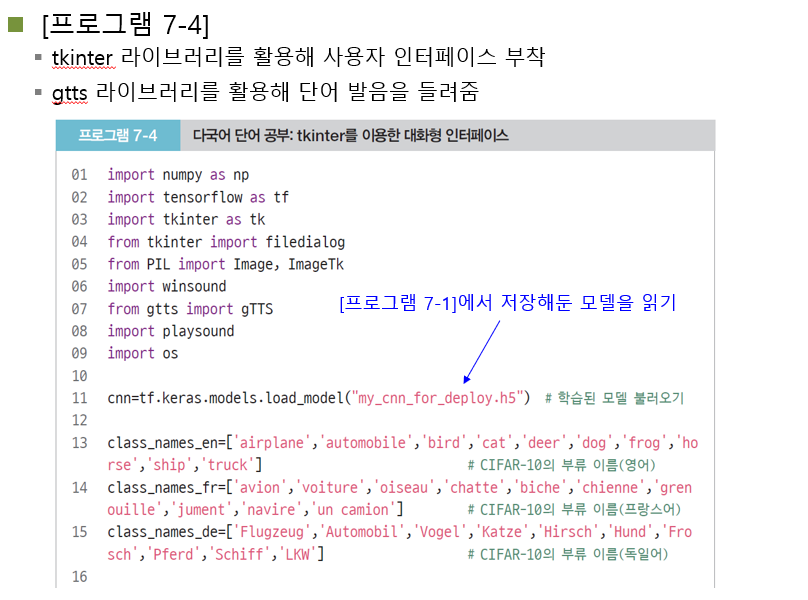

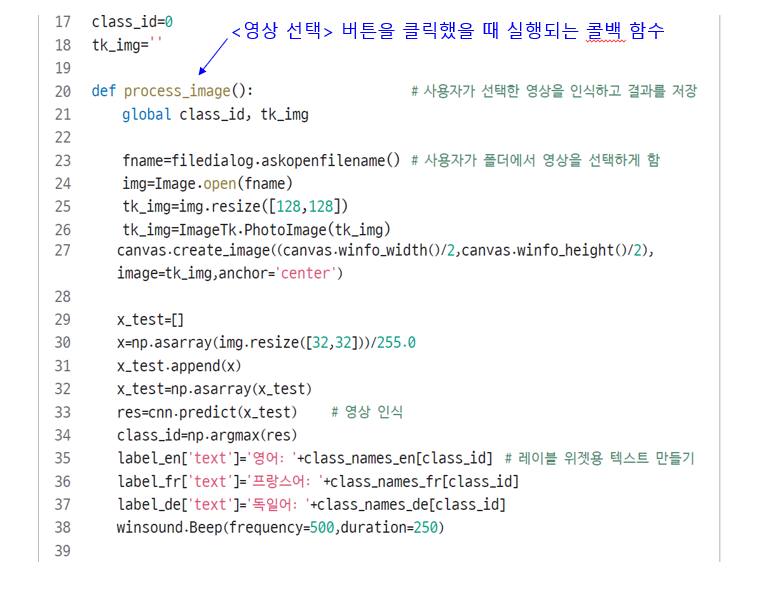

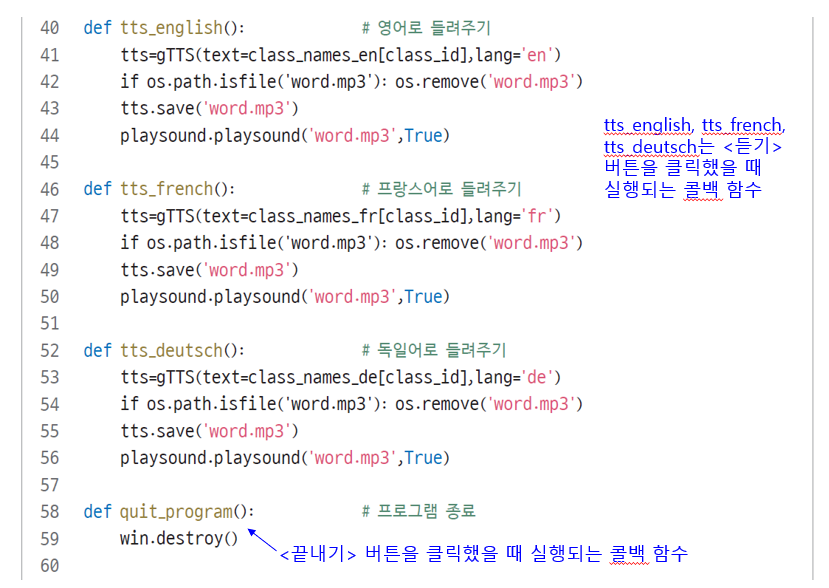

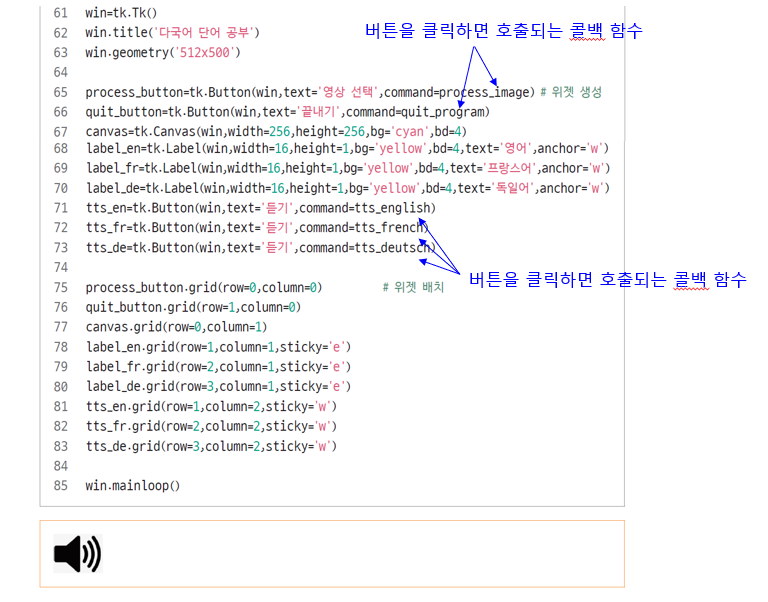

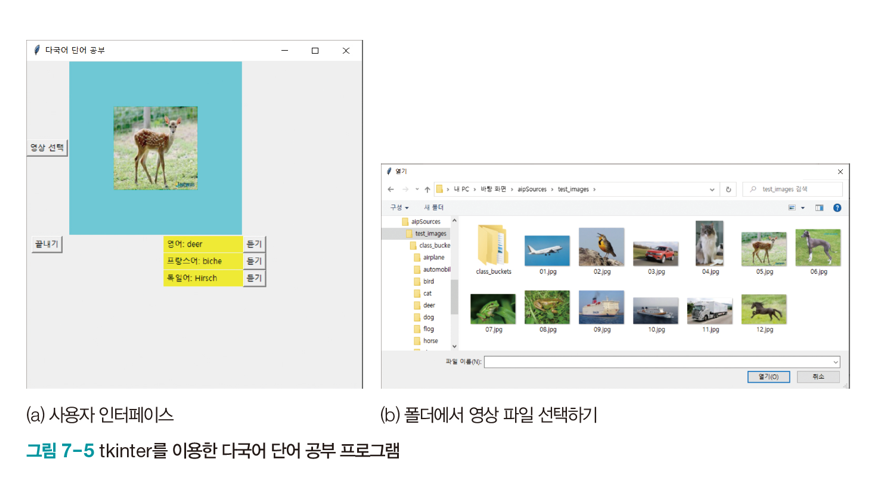

---

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 Google Colab 환경에서 학습된 CNN(CIFAR-10) 모델을 불러와,
# 사용자가 업로드한 이미지를 분류한 뒤, 분류 결과를 영어·프랑스어·독일어로 출력하고,
# 해당 단어의 영어 발음을 음성으로 재생하는 대화형 인터페이스 예제임.
# 이미지 업로드는 Colab의 `files.upload()`를 사용하며,
# 음성 출력은 gTTS(Google Text-to-Speech) 및 IPython.display를 활용함.
# ------------------------------------------------------------

# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: 필수 라이브러리 설치 및 임포트
# 2단계: 학습된 모델 로딩
# 3단계: 클래스 이름 정의 (다국어)
# 4단계: 사용자 이미지 업로드
# 5단계: 이미지 전처리 및 분류 수행
# 6단계: 결과 출력 및 영어 발음 음성 재생
# ------------------------------------------------------------

# ==============================
# 1단계: 필수 라이브러리 임포트
# ==============================

# !pip install gtts playsound==1.2.2  
# → Colab 환경에서 gTTS (텍스트-음성 변환) 및 playsound 설치 명령
# → playsound 1.2.2 버전은 mp3 파일 재생 안정성이 높기 때문에 명시적으로 지정함

import numpy as np  
# → 이미지 데이터를 배열로 처리하고 수치 연산을 수행하기 위한 기본 수학 라이브러리

import tensorflow as tf  
# → 학습된 딥러닝 모델을 로딩하고 예측을 수행하기 위한 프레임워크

from gtts import gTTS  
# → Google의 TTS API를 사용하여 텍스트를 음성(mp3)으로 변환하는 라이브러리

import IPython.display as ipd  
# → Colab 환경에서 오디오 파일 등을 브라우저 내에서 재생하거나 시각적으로 출력하기 위한 모듈

import os  
# → 파일 경로 확인, mp3 저장 여부 확인 등 운영체제 수준의 파일 처리를 위한 라이브러리

from PIL import Image  
# → 이미지 파일을 열고 크기를 조절하고 배열로 변환하기 위한 라이브러리

# ==============================
# 2단계: 학습된 모델 로딩
# ==============================

file_path = "/content/drive/MyDrive/AI_2025_1st/my_cnn_for_deploy.h5"
# → 학습된 모델이 저장된 구글 드라이브 경로를 문자열 변수로 정의함

if os.path.exists(file_path):
    cnn = tf.keras.models.load_model(file_path)
    # → 지정된 경로에 모델 파일이 존재할 경우, 메모리로 로드함
    # → 로드된 모델은 이후 예측에 사용됨
else:
    raise FileNotFoundError(f"Model not found at {file_path}")
    # → 모델 파일이 존재하지 않으면 실행 중단 및 에러 메시지 출력

# ==============================
# 3단계: 클래스 이름 정의
# ==============================

class_names_en = [
    'airplane','automobile','bird','cat',
    'deer','dog','frog','horse','ship','truck'
    ]
# → CIFAR-10에 해당하는 10개 클래스의 영어 이름 리스트 정의

class_names_fr = [
    'avion','voiture','oiseau','chatte','biche',
    'chienne','grenouille','jument','navire','un camion'
    ]
# → 동일한 클래스의 프랑스어 이름 리스트 정의

class_names_de = [
    'Flugzeug','Automobil','Vogel','Katze','Hirsch',
    'Hund','Frosch','Pferd','Schiff','LKW'
    ]
# → 동일한 클래스의 독일어 이름 리스트 정의

# ==============================
# 4단계: 사용자 이미지 업로드
# ==============================

from google.colab import files  
# → Google Colab 전용 파일 업로드 기능을 사용하기 위해 files 모듈 임포트

uploaded = files.upload()  
# → 사용자로부터 하나 이상의 파일을 업로드 받음
# → 반환값은 딕셔너리 형식이며, key는 파일 이름, value는 바이너리 내용임

# ==============================
# 5단계: 이미지 전처리 및 예측 수행
# ==============================

for fname in uploaded.keys():  
    # → 업로드된 모든 파일에 대해 반복 처리함
    # → uploaded는 파일명:바이트 구조의 딕셔너리로, keys()는 파일명 리스트를 반환함

    print(f"Uploaded file: {fname}")  
    # → 업로드된 파일명을 출력하여 사용자에게 확인시킴

    img = Image.open(fname).resize((32, 32))  
    # → PIL을 사용해 이미지 파일을 열고, CIFAR-10 입력 크기인 32x32로 리사이징함
    # → 모델은 (32, 32, 3) 크기의 RGB 이미지 입력을 요구하므로 필수 전처리임

    x_test = np.asarray(img) / 255.0  
    # → 이미지를 numpy 배열로 변환하고, 픽셀 값을 0~1 사이로 정규화함
    # → CNN 모델은 정규화된 값을 기반으로 학습되었기 때문에 동일한 스케일로 입력해야 정확도 유지됨

    x_test = np.expand_dims(x_test, axis=0)  
    # → 모델은 배치 형태의 입력을 요구하므로, [1, 32, 32, 3] 형태로 차원 확장함
    # → 하나의 이미지만 입력할 경우에도 4차원 입력 형태가 필요함

    pred = cnn.predict(x_test)  
    # → 학습된 모델을 이용하여 전처리된 이미지에 대해 예측 수행함
    # → 출력은 10개의 클래스에 대한 softmax 확률 벡터임

    class_id = np.argmax(pred)  
    # → softmax 벡터 중 가장 확률이 높은 클래스의 인덱스를 추출함
    # → 해당 인덱스를 통해 다국어 클래스 이름에 접근 가능함

# ==============================
# 6단계: 결과 출력 및 음성 재생
# ==============================

    print(f"영어: {class_names_en[class_id]}")  
    # → 예측된 클래스의 영어 명칭을 출력함

    print(f"프랑스어: {class_names_fr[class_id]}")  
    # → 예측된 클래스의 프랑스어 명칭을 출력함

    print(f"독일어: {class_names_de[class_id]}")  
    # → 예측된 클래스의 독일어 명칭을 출력함

    # Play sound (English)
    tts = gTTS(text=class_names_en[class_id], lang='en')  
    # → 예측된 클래스의 영어 이름을 음성으로 변환하기 위한 gTTS 객체 생성
    # → 언어 설정은 영어(`lang='en'`)로 지정함

    tts.save("word.mp3")  
    # → 변환된 음성을 "word.mp3" 파일로 저장함

    ipd.display(ipd.Audio("word.mp3"))  
    # → Colab 환경 내에서 mp3 파일을 내장 오디오 플레이어로 재생함
    # → 브라우저 상에서 사용자에게 직접 음성을 들려줄 수 있음

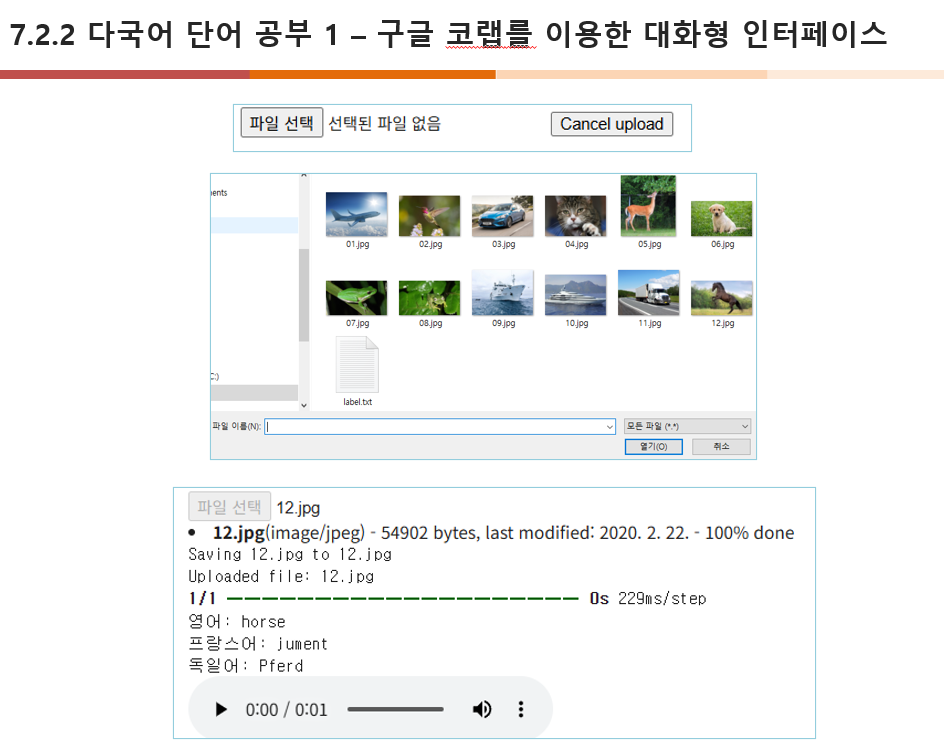

---

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 실시간 웹캠을 통해 캡처한 이미지를 기반으로 학습된 CIFAR-10 분류 모델을 사용하여,
# 해당 이미지의 객체를 분류하고 그 결과를 영어, 프랑스어, 독일어로 출력한 뒤,
# 선택된 언어에 따라 음성으로도 들려주는 데스크탑 GUI 프로그램임.
# OpenCV를 이용해 웹캠에서 프레임을 읽고, PIL과 numpy로 전처리하며,
# gTTS와 playsound를 통해 텍스트 음성을 재생하고, tkinter로 사용자 인터페이스를 구성함.
# ------------------------------------------------------------

# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: 필요한 라이브러리 임포트
# 2단계: 모델 및 클래스 이름 정의
# 3단계: 영상 처리 및 예측 함수 정의
# 4단계: 다국어 음성 출력 함수 정의
# 5단계: GUI 종료 함수 정의
# 6단계: GUI 구성 요소 생성
# 7단계: GUI 구성 요소 배치
# 8단계: 이벤트 루프 실행
# ------------------------------------------------------------

# ==============================
# 1단계: 필요한 라이브러리 임포트
# ==============================

import numpy as np  
# 이미지 데이터 배열화 및 정규화를 위한 수치 계산 라이브러리 임포트

import tensorflow as tf  
# 학습된 딥러닝 모델을 로딩하고 예측을 수행하기 위한 텐서플로우 임포트

import tkinter as tk  
# 데스크탑 GUI 애플리케이션 생성을 위한 표준 Python 인터페이스 툴킷 임포트

from tkinter import filedialog  
# 파일 선택 다이얼로그를 열기 위한 tkinter의 하위 모듈 임포트

from PIL import Image, ImageTk  
# 이미지 로딩 및 Tkinter에서 사용할 수 있는 형식으로 변환을 위한 라이브러리 임포트

import winsound  
# Windows 환경에서 효과음(BEEP)을 재생하기 위한 모듈 임포트

from gtts import gTTS  
# Google Text-to-Speech API를 사용하여 텍스트를 음성으로 변환하기 위한 라이브러리 임포트

import playsound  
# mp3 음성 파일을 재생하기 위한 경량 오디오 재생 라이브러리 임포트

import os  
# 파일 경로 확인 및 파일 존재 여부 판단을 위한 운영체제 인터페이스 모듈 임포트

import cv2  
# 웹캠 영상 캡처 및 이미지 전처리를 위한 OpenCV 라이브러리 임포트

# ==============================
# 2단계: 모델 및 클래스 이름 정의
# ==============================

cnn=tf.keras.models.load_model("my_cnn_for_deploy.h5")
# 학습된 CIFAR-10 분류 모델(.h5 포맷)을 로드하여 cnn 객체에 저장함
# 이 모델은 10개의 클래스(비행기, 개, 고양이 등)를 분류하도록 학습됨

class_names_en=[
    'airplane','automobile','bird','cat',
    'deer','dog','frog','horse','ship','truck'
    ]
# CIFAR-10 클래스 이름을 영어로 정의한 리스트

class_names_fr=[
    'avion','voiture','oiseau','chatte','biche',
    'chienne','grenouille','jument','navire','un camion'
    ]
# CIFAR-10 클래스 이름을 프랑스어로 정의한 리스트

class_names_de=[
    'Flugzeug','Automobil','Vogel','Katze','Hirsch',
    'Hund','Frosch','Pferd','Schiff','LKW'
    ]
# CIFAR-10 클래스 이름을 독일어로 정의한 리스트

class_id=0  
# 예측된 클래스의 인덱스를 저장할 전역 변수 선언

tk_img=''  
# 캔버스에 표시할 이미지 객체(Tkinter용)를 저장할 변수 선언

# ==============================
# 3단계: 영상 처리 및 예측 함수 정의
# ==============================

def process_video():
    global class_id, tk_img  # 함수 내부에서 전역 변수 사용을 허용함

    video = cv2.VideoCapture(0)  
    # → 기본 웹캠 장치를 열어 실시간 영상을 캡처할 수 있도록 설정함
    # → 인덱스 0은 첫 번째 연결된 카메라를 의미함

    while video.isOpened():
        success, frame = video.read()  
        # → 프레임을 성공적으로 읽으면 success=True, frame에는 현재 이미지 저장
        if success:
            cv2.imshow('Camera', frame)  
            # → OpenCV 창에 현재 프레임을 표시함

            key = cv2.waitKey(1) & 0xFF  
            # → 키 입력을 대기함 (1ms). 반환된 키 값을 하위 8비트로 처리함
            if key == 27:  # ESC 키가 눌렸는지 확인
                break  # 반복문 종료 → 웹캠 촬영 종료

    video.release()  
    # → 웹캠 장치를 해제하여 다른 프로그램에서 사용할 수 있도록 함

    cv2.destroyAllWindows()  
    # → OpenCV로 열린 모든 창을 닫음

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  
    # → OpenCV는 BGR 포맷을 사용하므로 PIL이 사용하는 RGB로 변환함

    img = Image.fromarray(frame)  
    # → numpy 배열(BGR→RGB 변환된 프레임)을 PIL 이미지 객체로 변환함

    tk_img = img.resize([128, 128])  
    # → Tkinter Canvas에 표시할 이미지를 적절한 크기로 리사이징함

    tk_img = ImageTk.PhotoImage(tk_img)  
    # → PIL 이미지를 Tkinter에서 사용할 수 있는 포맷으로 변환함

    canvas.create_image(
            (
            canvas.winfo_width() / 2, 
            canvas.winfo_height() / 2
            ), 
            image=tk_img, anchor='center'
        )  
    # → Canvas 중심에 이미지 배치 (anchor='center'는 중심 좌표 기준 정렬)

    x_test = []  # 모델 입력용 이미지 리스트 초기화

    x = np.asarray(img.resize([32, 32])) / 255.0  
    # → 모델 입력 크기인 32x32로 리사이즈하고, 픽셀 값을 정규화(0~1)함

    x_test.append(x)  
    # → 전처리된 이미지 배열을 리스트에 추가함

    x_test = np.asarray(x_test)  
    # → 리스트를 numpy 배열로 변환하여 모델 입력 형식 [1, 32, 32, 3]으로 만듦

    res = cnn.predict(x_test)  
    # → 학습된 모델을 사용하여 예측 수행 (출력은 10개 클래스의 확률 벡터)

    class_id = np.argmax(res)  
    # → 예측 결과 중 가장 높은 확률을 가진 클래스의 인덱스를 저장함

    label_en['text'] = '영어: ' + class_names_en[class_id]  
    # → 예측 결과를 영어로 GUI에 출력함

    label_fr['text'] = '프랑스어: ' + class_names_fr[class_id]  
    # → 예측 결과를 프랑스어로 출력

    label_de['text'] = '독일어: ' + class_names_de[class_id]  
    # → 예측 결과를 독일어로 출력

    winsound.Beep(frequency=500, duration=250)  
    # → 예측 완료 알림용 효과음을 재생함 (500Hz, 250ms)

# ==============================
# 4단계: 다국어 음성 출력 함수 정의
# ==============================

def tts_english():
    tts = gTTS(text=class_names_en[class_id], lang='en')  
    # → 예측된 클래스의 영어 이름을 gTTS로 음성 객체 생성

    if os.path.isfile('word.mp3'):
        os.remove('word.mp3')  
        # → 기존 mp3 파일이 존재하면 삭제하여 파일 충돌 방지

    tts.save('word.mp3')  
    # → mp3 파일로 저장

    playsound.playsound('word.mp3', True)  
    # → 저장된 mp3 파일을 동기적으로 재생

def tts_french():
    tts = gTTS(text=class_names_fr[class_id], lang='fr')  
    if os.path.isfile('word.mp3'):
        os.remove('word.mp3')
    tts.save('word.mp3')
    playsound.playsound('word.mp3', True)

def tts_deutsch():
    tts = gTTS(text=class_names_de[class_id], lang='de')  
    if os.path.isfile('word.mp3'):
        os.remove('word.mp3')
    tts.save('word.mp3')
    playsound.playsound('word.mp3', True)

# ==============================
# 5단계: 프로그램 종료 함수 정의
# ==============================

def quit_program():
    win.destroy()  
    # → Tkinter GUI 프로그램을 종료함

# ==============================
# 6단계: GUI 구성 요소 생성
# ==============================

win = tk.Tk()  
# → 최상위 윈도우 객체 생성

win.title('다국어 단어 공부')  
# → 윈도우 제목 설정

win.geometry('512x500')  
# → 윈도우 크기 설정

process_button = tk.Button(win, text='비디오 선택', command=process_video)  
# → 실시간 웹캠 예측 버튼 생성 및 클릭 시 process_video 함수 실행

quit_button = tk.Button(win, text='끝내기', command=quit_program)  
# → 종료 버튼 생성

canvas = tk.Canvas(win, width=256, height=256, bg='cyan', bd=4)  
# → 예측된 이미지를 표시할 캔버스 생성

label_en = tk.Label(win, width=16, height=1, bg='yellow', bd=4, text='영어', anchor='w')  
# → 영어 예측 결과 표시용 레이블 생성

label_fr = tk.Label(win, width=16, height=1, bg='yellow', bd=4, text='프랑스어', anchor='w')  
# → 프랑스어 예측 결과 표시용 레이블 생성

label_de = tk.Label(win, width=16, height=1, bg='yellow', bd=4, text='독일어', anchor='w')  
# → 독일어 예측 결과 표시용 레이블 생성

tts_en = tk.Button(win, text='듣기', command=tts_english)  
# → 영어 음성 출력 버튼 생성

tts_fr = tk.Button(win, text='듣기', command=tts_french)  
# → 프랑스어 음성 출력 버튼 생성

tts_de = tk.Button(win, text='듣기', command=tts_deutsch)  
# → 독일어 음성 출력 버튼 생성

# ==============================
# 7단계: GUI 구성 요소 배치
# ==============================

process_button.grid(row=0, column=0)  
# → 예측 실행 버튼을 좌측 상단에 배치

quit_button.grid(row=1, column=0)  
# → 종료 버튼을 그 아래에 배치

canvas.grid(row=0, column=1)  
# → 캔버스를 첫 번째 행, 두 번째 열에 배치

label_en.grid(row=1, column=1, sticky='e')  
label_fr.grid(row=2, column=1, sticky='e')  
label_de.grid(row=3, column=1, sticky='e')  
# → 세 개의 언어 레이블을 각각 다음 행에 배치, 오른쪽 정렬

tts_en.grid(row=1, column=2, sticky='w')  
tts_fr.grid(row=2, column=2, sticky='w')  
tts_de.grid(row=3, column=2, sticky='w')  
# → 세 개의 듣기 버튼을 각각 레이블 옆에 왼쪽 정렬로 배치

# ==============================
# 8단계: 이벤트 루프 실행
# ==============================

win.mainloop()  
# → tkinter GUI 프로그램의 메인 루프 실행
# → 사용자가 종료할 때까지 이벤트를 감지하고 반응함



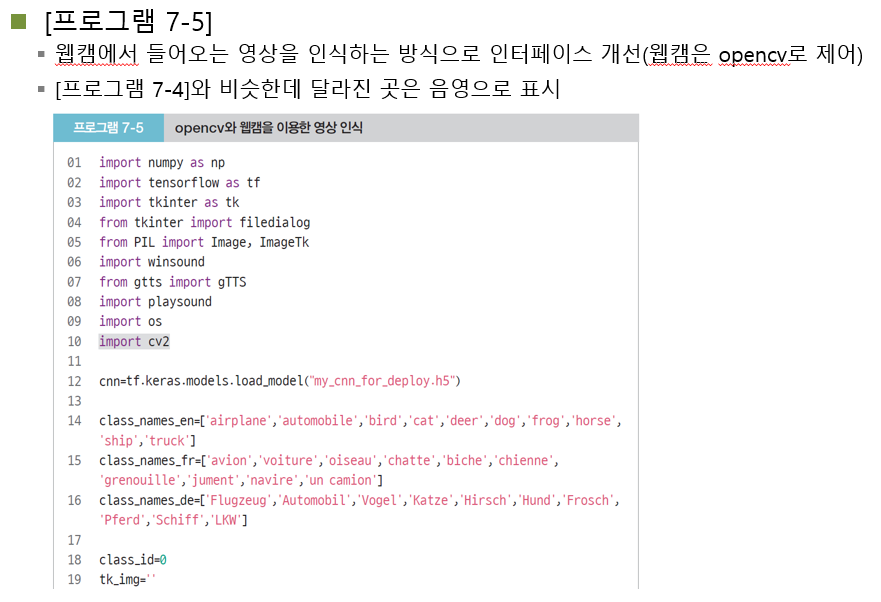

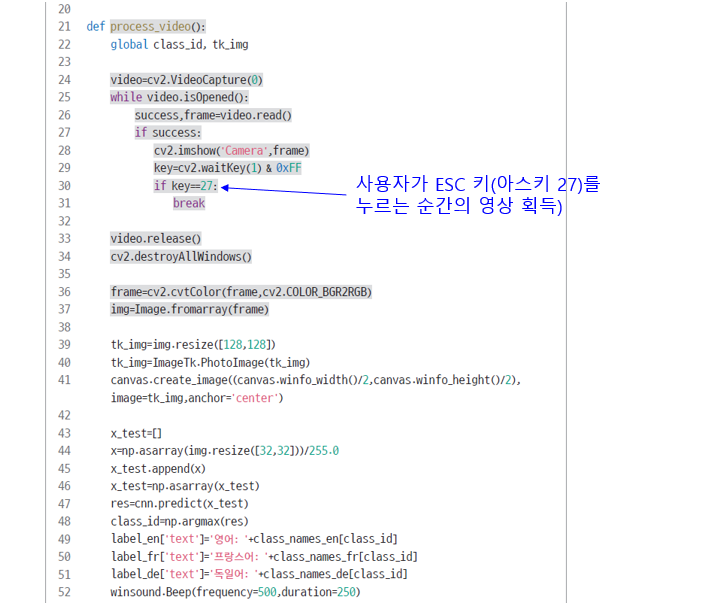

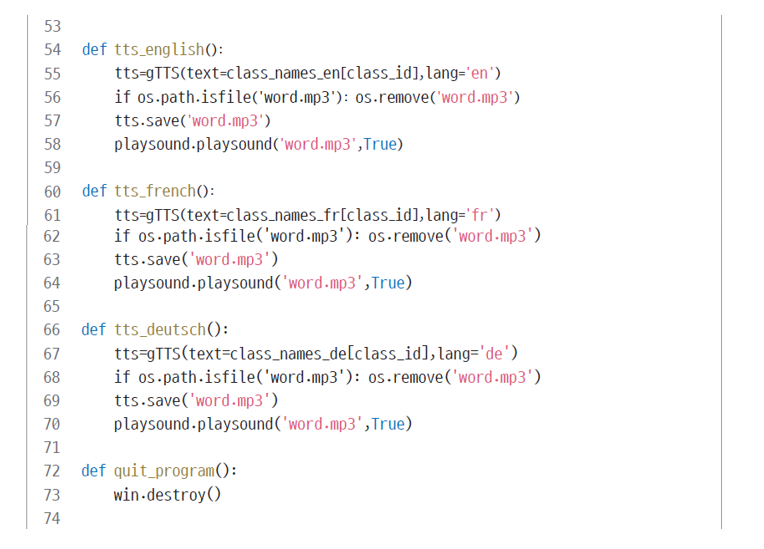

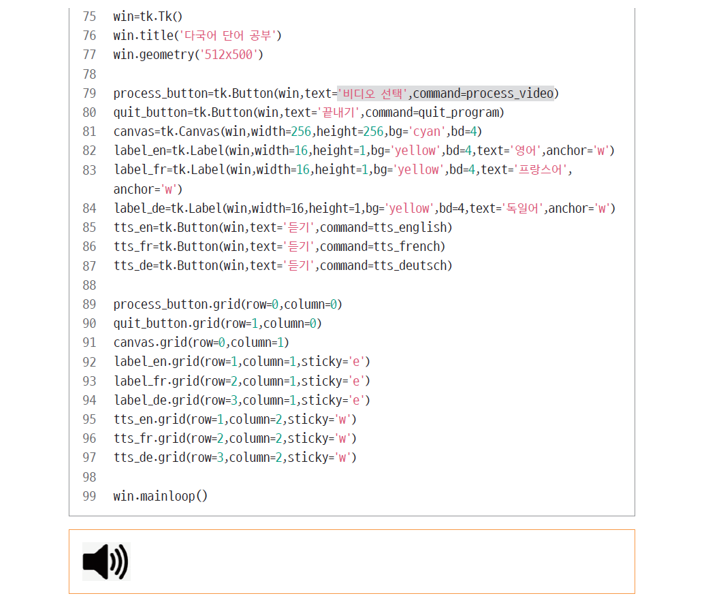

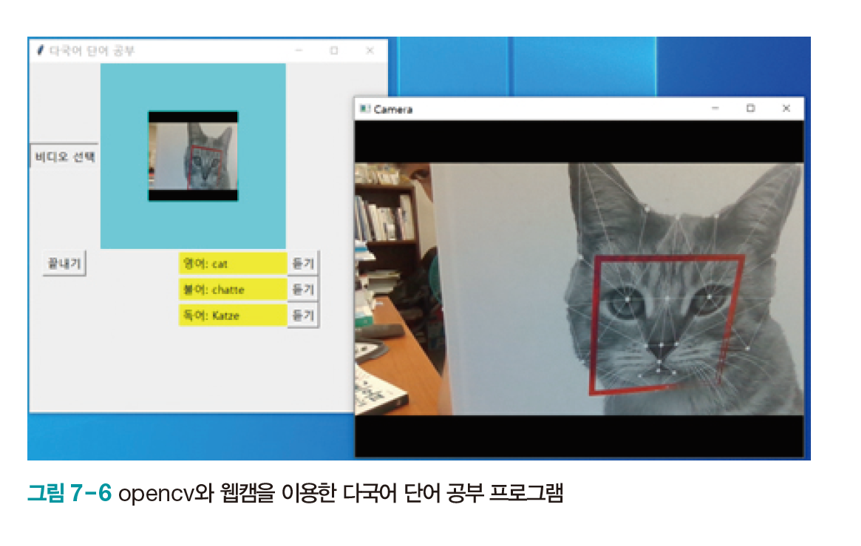

---

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 Google Colab 환경에서 학습된 CIFAR-10 분류 모델을 사용하여  
# 사용자가 업로드한 이미지를 분류하고, 예측된 클래스명을  
# 영어, 프랑스어, 독일어로 출력하며, 각 언어에 대한 발음을  
# gTTS(Google Text-to-Speech)와 IPython.display를 이용해 음성으로 재생하는  
# 대화형 이미지 분류 및 언어 학습 데모 인터페이스임.
# ------------------------------------------------------------

# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: 필요한 라이브러리 설치 및 임포트
# 2단계: 학습된 모델 로드
# 3단계: 클래스 이름 정의 (다국어)
# 4단계: 이미지 업로드 및 예측 함수 정의
# 5단계: TTS 기반 음성 출력 함수 정의
# 6단계: 인터페이스 실행 및 결과 출력
# ------------------------------------------------------------

# ==============================
# 1단계: 필요한 라이브러리 설치 및 임포트
# ==============================

!pip install gtts playsound==1.2.2  
# → Google Colab 환경에 gTTS (텍스트 → 음성 변환)와 playsound 오디오 재생 패키지 설치 명령
# → playsound 1.2.2 버전은 Colab에서의 안정적인 mp3 재생을 보장함

import numpy as np  
# → 이미지 데이터를 배열로 변환하고 수치 연산을 수행하기 위한 라이브러리

import tensorflow as tf  
# → 학습된 딥러닝 모델을 로드하고 예측을 수행하기 위한 프레임워크

from gtts import gTTS  
# → Google의 Text-to-Speech API로 텍스트를 mp3 음성 파일로 변환하기 위한 모듈

import IPython.display as ipd  
# → Colab 환경에서 이미지, 오디오, HTML 등의 출력을 위한 인터페이스 제공 모듈

import os  
# → 파일의 존재 여부 확인, 삭제, 저장 등의 파일 시스템 작업을 수행하기 위한 라이브러리

from PIL import Image  
# → 이미지 파일을 로드하고 크기 변환 등 전처리를 수행하기 위한 이미지 처리 라이브러리

from google.colab import files  
# → Google Colab에서 사용자로부터 파일을 업로드 받기 위한 Colab 전용 모듈

from IPython.display import display  
# → PIL 이미지나 위젯을 Colab 셀 안에 출력하기 위한 display 함수 임포트

# ==============================
# 2단계: 학습된 모델 로드
# ==============================

model_path = '/content/drive/MyDrive/AI_2025_1st/my_cnn_for_deploy.h5'  
# → 학습된 모델이 저장되어 있는 Google Drive의 파일 경로를 변수로 지정함

cnn = tf.keras.models.load_model(model_path)  
# → 지정된 경로에서 .h5 포맷의 Keras 모델을 메모리로 로딩하여 cnn 객체에 저장함

# ==============================
# 3단계: 클래스 이름 정의 (다국어)
# ==============================

class_names_en = [
    'airplane','automobile','bird','cat',
    'deer','dog','frog','horse','ship','truck'
    ]  
# → CIFAR-10의 10개 클래스 이름을 영어로 정의한 리스트

class_names_fr = [
    'avion','voiture','oiseau','chatte','biche',
    'chienne','grenouille','jument','navire','un camion'
    ]  
# → 동일한 10개 클래스에 대한 프랑스어 번역 리스트

class_names_de = [
    'Flugzeug','Automobil','Vogel','Katze',
    'Hirsch','Hund','Frosch','Pferd','Schiff','LKW'
    ]  
# → 동일한 10개 클래스에 대한 독일어 번역 리스트

# ==============================
# 4단계: 이미지 업로드 및 예측 함수 정의
# ==============================

def upload_and_predict():  
    # → 사용자가 이미지를 업로드하고, 업로드된 이미지에 대해 예측을 수행하는 함수 정의

    uploaded = files.upload()  
    # → Colab 인터페이스를 통해 사용자가 로컬에서 이미지를 업로드할 수 있는 다이얼로그를 표시함
    # → 반환값은 {파일이름: 바이너리데이터} 형식의 딕셔너리임

    for fname in uploaded.keys():  
        # → 업로드된 모든 파일에 대해 순차적으로 예측을 수행하기 위한 반복문 정의

        print(f"\n 업로드한 이미지: {fname}")  
        # → 업로드된 이미지의 파일명을 사용자에게 출력함

        img = Image.open(fname).convert('RGB')  
        # → PIL을 이용해 이미지 파일을 열고, RGB 포맷으로 강제 변환하여 색상 채널 통일함
        # → 흑백 이미지 등의 예외 상황을 방지하기 위해 RGB로 강제 변환함

        display(img)  
        # → IPython.display를 이용해 업로드된 이미지를 셀 내부에 시각적으로 출력함

        # ===== 예측 처리 =====
        x = img.resize((32, 32))  
        # → CIFAR-10 학습 기준에 맞춰 이미지를 32x32로 리사이즈함

        x = np.asarray(x) / 255.0  
        # → 이미지를 numpy 배열로 변환하고, 픽셀 값을 0~1 범위로 정규화함

        x = np.expand_dims(x, axis=0)  
        # → 모델 입력 형식인 4차원 배열(batch_size, height, width, channels)로 맞추기 위해 차원 확장 수행

        pred = cnn.predict(x)  
        # → 학습된 모델(cnn)을 이용해 예측을 수행함
        # → 출력은 10개의 클래스에 대한 확률 값 배열임

        class_id = np.argmax(pred)  
        # → 가장 높은 확률을 가진 인덱스를 클래스 ID로 추출함

        print(f"\n 예측 결과:")
        print(f"영어: {class_names_en[class_id]}")  
        # → 예측된 클래스의 영어 이름 출력

        print(f"프랑스어: {class_names_fr[class_id]}")  
        # → 예측된 클래스의 프랑스어 이름 출력

        print(f"독일어: {class_names_de[class_id]}")  
        # → 예측된 클래스의 독일어 이름 출력

        return class_id  
        # → 예측된 클래스의 인덱스를 반환함 (나중에 TTS에서 활용됨)

# ==============================
# 5단계: TTS 기반 음성 출력 함수 정의
# ==============================

def speak(text, lang='en'):  
    # → 입력된 텍스트(text)를 특정 언어(lang)로 음성 변환하여 mp3로 저장하고 재생 객체를 반환하는 함수

    tts = gTTS(text=text, lang=lang)  
    # → Google Text-to-Speech API를 이용해 텍스트를 음성 객체로 변환함

    tts.save("word.mp3")  
    # → 변환된 음성을 "word.mp3"라는 이름으로 저장함

    return ipd.Audio("word.mp3")  
    # → IPython.display.Audio 객체를 반환하여 Colab 환경에서 재생 가능하도록 함

# ==============================
# 6단계: 실행 및 음성 출력
# ==============================

class_id = upload_and_predict()  
# → 이미지 업로드 및 예측 수행 → 예측된 클래스 인덱스를 변수로 저장함

if class_id is not None:  
    # → 예측이 정상적으로 수행되어 class_id가 반환된 경우에만 다음 단계 진행

    print("\n 영어 발음:")
    display(speak(class_names_en[class_id], 'en'))  
    # → 영어 단어의 발음을 생성 및 출력함

    print("\n 프랑스어 발음:")
    display(speak(class_names_fr[class_id], 'fr'))  
    # → 프랑스어 단어의 발음을 생성 및 출력함

    print("\n 독일어 발음:")
    display(speak(class_names_de[class_id], 'de'))  
    # → 독일어 단어의 발음을 생성 및 출력함



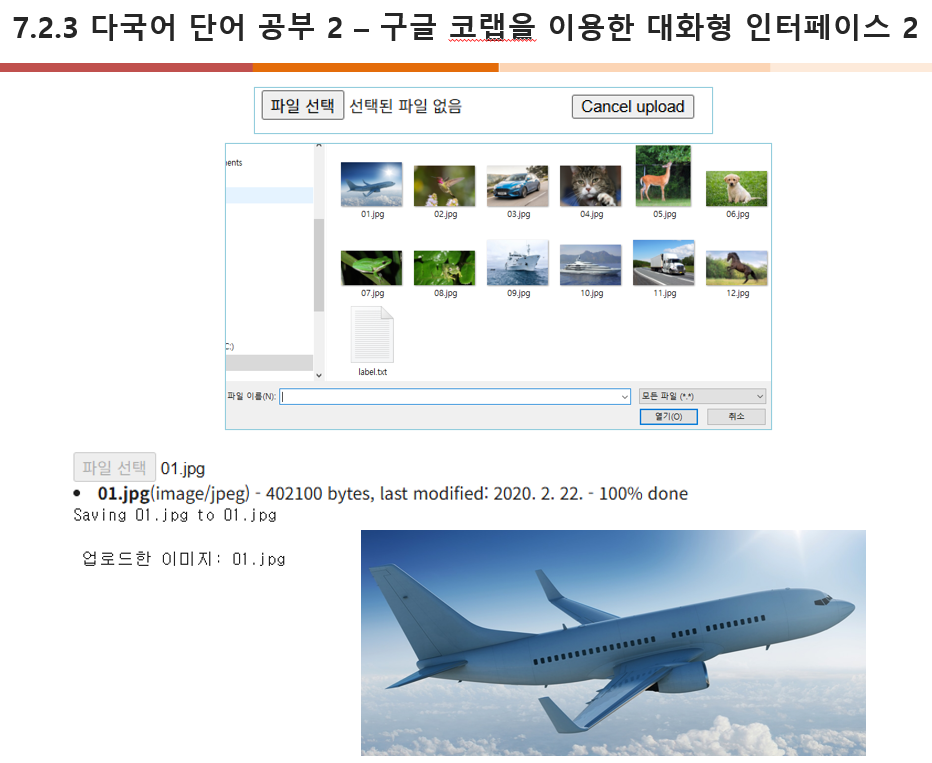

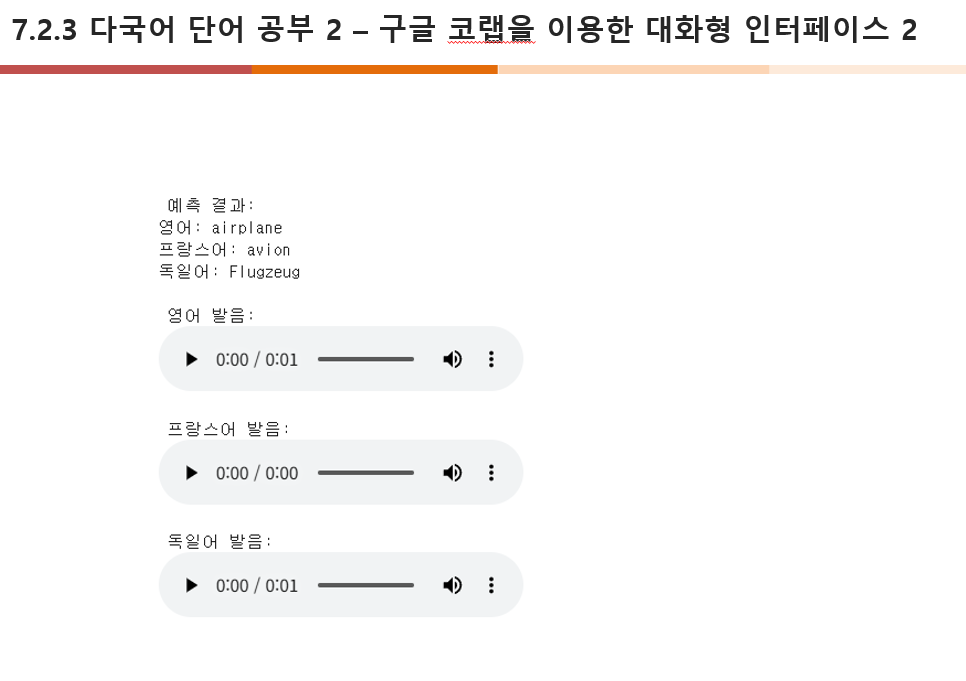

---

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 YOLOv3(You Only Look Once) 딥러닝 기반 객체 탐지 모델을 활용하여,
# 사용자의 웹캠으로부터 실시간으로 입력되는 영상에서 다양한 객체를 탐지하고,
# 그 중 "사람(person)"이 탐지되었을 경우에는 콘솔에 경고 메시지를 출력하고
# Windows 시스템 사운드를 통해 음성 알림을 발생시키는 간이 보안 감시 시스템 구현 예제임.
# OpenCV의 DNN 모듈을 사용하여 YOLOv3 모델을 로드하고,
# 실시간 영상에서 프레임 단위로 객체 탐지를 수행하며 시각적으로 결과를 출력함.
# ------------------------------------------------------------

# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: 객체 클래스 이름과 시각화용 색상 정의
# 2단계: YOLOv3 네트워크 모델 로드 및 출력 레이어 지정
# 3단계: 실시간 비디오 입력 설정 및 프레임 단위 처리
# 4단계: 객체 탐지 후 결과 후처리 및 시각화
# 5단계: '사람' 클래스 탐지 시 사운드 경고 발생
# 6단계: 사용자 종료 입력 시 자원 해제 및 종료
# ------------------------------------------------------------

import numpy as np
import cv2
import winsound

# ==============================
# 1단계: 클래스 이름 및 색상 정의
# ==============================

classes = []  
# → coco.names.txt 파일에서 불러올 클래스 이름을 저장하기 위한 리스트 초기화

f = open('coco.names.txt', 'r')  
# → COCO 데이터셋 클래스 이름이 한 줄씩 저장된 텍스트 파일을 읽기 모드로 엶

classes = [line.strip() for line in f.readlines()]  
# → 파일의 각 줄에서 줄바꿈 문자 제거 후 리스트에 저장함
# → YOLO 모델이 탐지 가능한 클래스 이름들로 구성됨 (예: person, car, dog 등)

colors = np.random.uniform(0, 255, size=(len(classes), 3))  
# → 클래스마다 시각화할 RGB 색상을 무작위로 지정함
# → 각 클래스가 다른 색상의 바운딩 박스로 표시되도록 설정함

# ==============================
# 2단계: YOLOv3 모델 로딩 및 출력 레이어 지정
# ==============================

yolo_model = cv2.dnn.readNet('yolov3.weights', 'yolov3.cfg')  
# → 훈련된 YOLOv3 모델의 가중치(.weights)와 구성 파일(.cfg)을 읽어와 DNN 네트워크로 로딩함
# → OpenCV의 DNN 모듈을 통해 불러온 네트워크는 추론(inference)에 사용 가능함

layer_names = yolo_model.getLayerNames()  
# → 전체 네트워크의 모든 레이어 이름을 리스트로 반환받음
# → 이름은 순서대로 지정되며 인덱스는 0부터 시작함

out_layers = [layer_names[i[0] - 1] for i in yolo_model.getUnconnectedOutLayers()]  
# → 출력 레이어의 인덱스를 기반으로 실제 출력 레이어 이름을 추출함
# → YOLO는 다중 스케일 출력 구조이므로, 모델이 직접 반환하는 출력 레이어만 선택해야 함

# ==============================
# 3단계: 실시간 영상 처리 및 객체 탐지
# ==============================

def process_video():  
    # → 웹캠으로부터 실시간으로 영상을 입력받고, 각 프레임에서 객체를 탐지한 후
    #    사람이 발견되면 경고음을 울리는 로직을 포함한 메인 함수 정의

    video = cv2.VideoCapture(0)  
    # → 기본 카메라(장치 인덱스 0번)를 열어 실시간 영상 스트림 캡처 객체 생성
    # → 영상 스트리밍이 시작됨

    while video.isOpened():  
        # → 비디오 캡처 객체가 정상적으로 열려 있는 동안 반복 수행
        # → 사용자가 강제 종료할 때까지 실시간 분석을 계속함

        success, img = video.read()  
        # → 현재 프레임 한 장을 읽어옴
        # → success는 읽기에 성공했는지를 나타내는 불리언 값
        # → img는 현재 프레임 이미지 데이터를 의미함

        if success:  
            # → 프레임 읽기에 성공한 경우만 다음 탐지 처리 단계로 진행함

            height, width, channels = img.shape  
            # → 현재 프레임의 세로(height), 가로(width), 채널 수(예: RGB = 3)를 추출함
            # → 후속 처리에서 바운딩 박스 좌표 계산에 필요함

            blob = cv2.dnn.blobFromImage(
                img, 1.0 / 256, (448, 448), (0, 0, 0), swapRB=True, crop=False
            )  
            # → YOLO 네트워크에 입력 가능한 형태로 이미지를 변환함
            # → 픽셀 값 정규화(1/256), 크기 조정(448x448), BGR→RGB 변환 포함
            # → crop=False 설정으로 이미지를 비율 유지하며 리사이즈함

            yolo_model.setInput(blob)  
            # → 변환된 blob 이미지를 YOLO 네트워크에 입력으로 설정함

            output3 = yolo_model.forward(out_layers)  
            # → 설정한 출력 레이어를 기준으로 네트워크에 대해 전방향 추론(forward propagation)을 수행함
            # → 결과는 여러 레이어에서 추출된 탐지 후보 객체들의 리스트로 반환됨

            class_ids, confidences, boxes = [], [], []  
            # → 탐지된 객체들의 클래스 인덱스, 신뢰도 점수, 바운딩 박스 좌표를 저장할 리스트 초기화

# ==============================
# 4단계: 객체 탐지 결과 후처리 및 바운딩 박스 처리
# ==============================

            for output in output3:
                # → YOLO 출력 레이어들에서 반환된 탐지 결과(output)를 반복함

                for vec85 in output:
                    # → 각 output에서 85개 값(객체 1개에 해당하는 정보)을 가진 벡터 반복 처리함

                    scores = vec85[5:]
                    # → 앞 5개는 위치와 객체성(objectness) 점수이며, 이후는 각 클래스별 확률임

                    class_id = np.argmax(scores)
                    # → 가장 확률이 높은 클래스의 인덱스를 예측된 클래스 ID로 설정함

                    confidence = scores[class_id]
                    # → 해당 클래스의 확률을 신뢰도로 사용함

                    if confidence > 0.5:
                        # → 신뢰도 기준 이상일 경우에만 유효한 탐지로 간주함

                        centerx, centery = int(vec85[0]*width), int(vec85[1]*height)
                        # → YOLO 출력값은 0~1 비율값이므로, 실제 프레임 크기로 환산함

                        w, h = int(vec85[2]*width), int(vec85[3]*height)
                        # → 박스의 너비와 높이 계산

                        x, y = int(centerx - w/2), int(centery - h/2)
                        # → 좌상단 기준 바운딩 박스 좌표 계산

                        boxes.append([x, y, w, h])
                        confidences.append(float(confidence))
                        class_ids.append(class_id)

# ==============================
# 5단계: 비최대 억제(NMS) 적용 및 시각화
# ==============================

            indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
            # → 같은 객체에 대한 중복 박스를 제거하는 NMS(Non-Maximum Suppression) 적용

            for i in range(len(boxes)):
                if i in indexes:
                    # → NMS에 의해 선택된 객체만 시각화 대상으로 설정함

                    x, y, w, h = boxes[i]
                    text = str(classes[class_ids[i]]) + ' %.3f' % confidences[i]

                    cv2.rectangle(img, (x, y), (x+w, y+h), colors[class_ids[i]], 2)
                    # → 탐지된 객체에 대한 바운딩 박스를 그려줌

                    cv2.putText(
                        img, text, (x, y+30), 
                        cv2.FONT_HERSHEY_PLAIN, 2, 
                        colors[class_ids[i]], 2
                        )
                    # → 클래스 이름 및 신뢰도를 이미지에 텍스트로 표시함

            cv2.imshow('Object detection', img)
            # → 현재 프레임의 탐지 결과 이미지를 화면에 출력함

# ==============================
# 6단계: 사람 탐지 시 알림 출력 및 종료 처리
# ==============================

            if 0 in class_ids:
                # → 클래스 인덱스 0은 'person'이므로, 사람이 탐지되었는지를 확인함

                print('사람이 나타났다!!!')
                winsound.Beep(frequency=2000, duration=500)
                # → 사람이 탐지되었을 경우 경고 메시지 출력 및 비프음 발생

        key = cv2.waitKey(1) & 0xFF
        # → 키보드 입력을 기다림. 실시간 영상 처리 중 UI가 응답성을 유지하도록 처리

        if key == 27:
            # → ESC 키(ASCII 27)가 눌렸을 경우 루프 종료

            break

    video.release()
    # → 비디오 캡처 객체 해제

    cv2.destroyAllWindows()
    # → 생성된 모든 OpenCV 윈도우를 종료함

# ==============================
# 7단계: 객체 탐지 프로세스 실행
# ==============================

process_video()
# → 위에서 정의한 실시간 객체 탐지 프로세스를 실행함



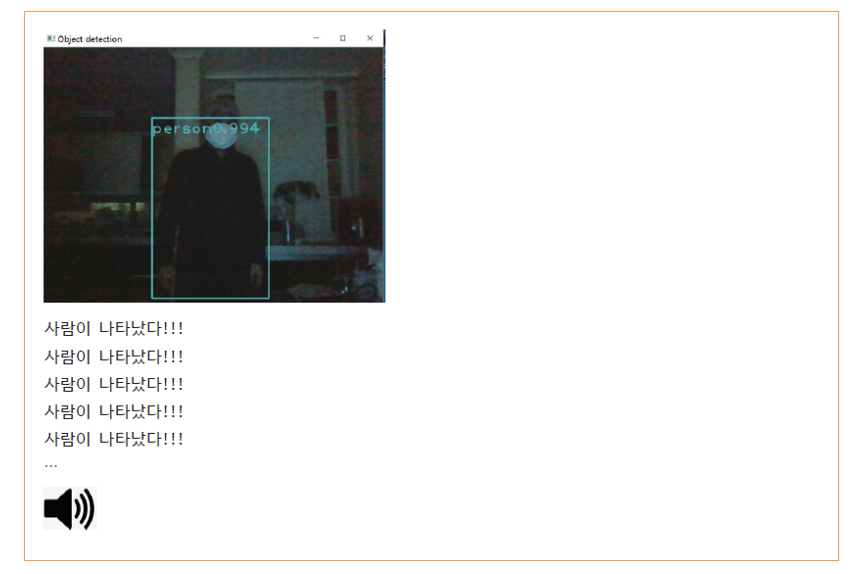

---

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 Google Colab 환경에서 YOLOv3(You Only Look Once v3) 객체 탐지 모델을 이용하여,
# 사용자가 업로드한 이미지에서 사람(person)을 포함한 객체를 탐지하고 시각화하며,
# 사람이 탐지될 경우 한국어 음성으로 경고 메시지를 출력하는 침입자 감지 프로그램임.
# gTTS(Google Text-to-Speech)를 이용한 음성 생성과 IPython.display를 활용한 Colab 내 오디오 출력이 포함됨.
# ------------------------------------------------------------

# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: 필요한 패키지 설치 및 임포트
# 2단계: 클래스 이름 불러오기 및 색상 지정
# 3단계: YOLOv3 모델 및 출력 계층 로딩
# 4단계: 음성 알림 함수 정의
# 5단계: 이미지 업로드 및 YOLO 추론 수행
# 6단계: 결과 시각화 및 사람 탐지 시 음성 경고 출력
# ------------------------------------------------------------

# ==============================
# 1단계: 필요한 패키지 설치 및 임포트
# ==============================

!pip install gtts playsound==1.2.2  
# → Google Colab 환경에 필요한 외부 패키지를 설치하는 명령어임  
# → gTTS는 Google Text-to-Speech 기능을 위한 라이브러리이며  
# → playsound는 mp3 형식의 음성 파일을 Colab에서 재생하기 위해 사용하는 모듈임  
# → playsound의 1.2.2 버전은 Colab에서의 안정적인 재생을 보장함

import numpy as np  
# → 이미지 전처리 및 벡터 계산 등 수치 연산을 수행하기 위한 파이썬 기본 과학 연산 라이브러리임

import cv2  
# → 이미지 처리 및 딥러닝 기반 객체 탐지 기능을 지원하는 OpenCV 라이브러리임  
# → 특히 DNN 모듈을 통해 YOLO 모델을 사용할 수 있음

from gtts import gTTS  
# → 텍스트를 mp3 형태의 음성으로 변환하는 Google의 TTS API를 사용하기 위한 모듈임

import IPython.display as ipd  
# → Google Colab 노트북 셀 내부에서 mp3 오디오 파일을 재생하고 시각적으로 출력하기 위한 IPython 기능 모듈임

import os  
# → mp3 파일 생성, 삭제, 경로 확인 등 파일 시스템 조작을 위해 사용되는 파이썬 내장 모듈임

from PIL import Image  
# → 업로드된 이미지를 불러오고 리사이징 및 RGB 포맷으로 변환하기 위한 파이썬 이미지 처리 라이브러리임

from google.colab.patches import cv2_imshow  
# → OpenCV의 imshow 함수는 Colab에서 직접 사용할 수 없기 때문에,  
# → Colab 환경에 맞게 이미지를 출력해주는 전용 함수(cv2_imshow)를 임포트함

from IPython.display import display  
# → PIL 이미지 객체나 음성 파일을 Colab 셀 내부에 직접 시각적으로 출력할 수 있도록 도와주는 함수임

# ==============================
# 2단계: 클래스 이름 불러오기 및 색상 정의
# ==============================

with open('/content/drive/MyDrive/AI_2025_1st/coco.names.txt', 'r') as f:  
    # → COCO 데이터셋에 포함된 객체 클래스 이름 목록이 저장된 텍스트 파일을 읽기 모드로 엶  
    # → 각 클래스 이름은 한 줄에 하나씩 저장되어 있음  
    classes = [line.strip() for line in f.readlines()]  
    # → 파일에서 모든 줄을 읽고, 각 줄의 양쪽 공백 문자를 제거한 후 리스트 형태로 저장함  
    # → 결과적으로 YOLOv3가 탐지 가능한 모든 객체 클래스 이름을 리스트로 보관함

colors = np.random.uniform(0, 255, size=(len(classes), 3))  
# → 시각화를 위해 클래스마다 고유한 RGB 색상을 무작위로 생성함  
# → 클래스 개수만큼 (R, G, B) 값을 가진 배열을 생성하여 색상 팔레트를 구성함

# ==============================
# 3단계: YOLOv3 모델 및 출력 계층 로딩
# ==============================

yolo_model = cv2.dnn.readNet('/content/drive/MyDrive/AI_2025_1st/yolov3.weights',
                             '/content/drive/MyDrive/AI_2025_1st/yolov3.cfg')  
# → 학습된 YOLOv3 모델의 가중치 파일(.weights)과 구성 설정 파일(.cfg)을 로드함  
# → OpenCV DNN 모듈을 통해 네트워크 구조와 파라미터를 메모리 상에 불러옴  
# → 모델은 이후 입력 이미지에 대한 예측을 수행할 준비를 완료함

layer_names = yolo_model.getLayerNames()  
# → 네트워크에 존재하는 모든 레이어의 이름을 리스트 형태로 추출함  
# → 추출된 이름은 출력 레이어를 식별하기 위한 기반 정보로 활용됨

# OpenCV 버전에 따라 출력 계층 정보 구조가 다를 수 있으므로 예외 처리 방식으로 대응함
try:
    out_layers = [layer_names[i[0] - 1] for i in yolo_model.getUnconnectedOutLayers()]  
    # → 최신 OpenCV 버전에서 getUnconnectedOutLayers()가 2차원 배열을 반환하는 경우 처리 방식임  
    # → YOLO의 출력 레이어(즉, 최종 예측 벡터가 나오는 레이어)의 이름을 추출함
except IndexError:
    out_layers = [layer_names[i - 1] for i in yolo_model.getUnconnectedOutLayers()]  
    # → 구버전 OpenCV에서는 단일 정수 배열로 반환되므로, 별도 분기하여 인덱싱함  
    # → 두 방식 모두 YOLO의 예측 결과가 출력되는 레이어 이름을 정확히 확보함

# ==============================
# 4단계: 음성 알림 함수 정의
# ==============================

def play_alert(message):  
    # → 사람(person)이 탐지되었을 때 사용자에게 경고 음성을 재생하는 함수 정의임  
    # → 입력 인자 `message`는 한국어 경고 문장을 포함하는 문자열임

    tts = gTTS(text=message, lang='ko')  
    # → Google Text-to-Speech(gTTS)를 이용해 입력된 메시지를 한국어 음성으로 변환함  
    # → 'ko'는 한국어를 의미하며, 음성 합성 시 사용할 언어로 지정함

    tts.save('alert.mp3')  
    # → 변환된 음성을 mp3 파일로 저장함  
    # → Colab에서 재생 가능한 형식으로 저장하여 이후 출력에 활용함

    return ipd.Audio('alert.mp3')  
    # → IPython.display.Audio 객체를 반환하여 Colab 셀 내부에서 mp3 음성을 출력 가능하게 함  
    # → 해당 객체는 display() 함수와 함께 사용하여 사용자에게 경고음을 재생함

# ==============================
# 5단계: 이미지 업로드 및 YOLO 추론 수행
# ==============================

from google.colab import files  
# → 사용자가 로컬 컴퓨터로부터 이미지를 업로드할 수 있도록 지원하는 Colab 전용 모듈을 임포트함  
# → files.upload() 기능을 통해 웹 기반 파일 업로드 인터페이스를 제공함

uploaded = files.upload()  
# → 파일 업로드 창을 띄워 사용자가 하나 이상의 이미지 파일을 업로드할 수 있도록 함  
# → 반환값은 {파일이름: 파일바이트} 형태의 딕셔너리이며, 각 파일에 대해 탐지 처리 가능함

for fname in uploaded.keys():  
    # → 업로드된 각 파일에 대해 반복문을 수행함  
    # → uploaded는 딕셔너리이므로 keys()를 통해 파일 이름 목록을 순회함

    img = cv2.imread(fname)  
    # → OpenCV를 이용하여 파일 이름에 해당하는 이미지를 BGR 형식으로 읽어옴  
    # → 이후 YOLO 모델 입력으로 사용될 원본 이미지임

    height, width, channels = img.shape  
    # → 이미지의 높이, 너비, 채널 수를 각각 추출함  
    # → YOLO의 출력 결과를 원본 이미지 크기에 맞게 되돌리기 위해 필수적으로 사용됨

    blob = cv2.dnn.blobFromImage(
        img, 1.0/255.0, (416, 416), (0,0,0), swapRB=True, crop=False
        )  
    # → 원본 이미지를 YOLOv3 모델에 입력할 수 있는 blob 포맷으로 변환함  
    # → 1) 픽셀 정규화 (1/255), 
    # 2) 416x416 사이즈 리사이징, 
    # 3) BGR → RGB 채널 순서 변경, 
    # 4) 크롭 없이 전체 사용

    yolo_model.setInput(blob)  
    # → 변환된 blob 데이터를 YOLOv3 모델의 입력으로 설정함  
    # → 내부적으로 forward propagation을 수행하기 위한 준비 단계임

    output3 = yolo_model.forward(out_layers)  
    # → 지정한 출력 계층들(out_layers)을 통해 모델 추론을 실행하고 예측 결과를 획득함  
    # → 결과는 여러 객체 후보들의 위치 및 클래스 확률을 포함한 리스트 형태로 반환됨

    class_ids, confidences, boxes = [], [], []  
    # → 탐지된 객체의 클래스 인덱스, 신뢰도, 바운딩 박스를 저장하기 위한 리스트 초기화 작업 수행

    for output in output3:  
        # → YOLO 모델이 반환한 여러 출력 레이어에 대해 반복 수행함  
        # → 각 output은 특정 레이어에서 탐지한 객체 후보 리스트를 포함함

        for vec85 in output:  
            # → 각 output 내부의 객체 후보 벡터(길이 85)를 하나씩 순회함  
            # → 앞의 4개는 위치 정보(center x, center y, width, height),  
            # → 1개는 objectness score, 나머지 80개는 클래스별 확률로 구성됨

            scores = vec85[5:]  
            # → 클래스별 확률(score)만 분리하여 저장함  
            # → 5번째 이후 인덱스가 클래스와 관련된 softmax 결과임

            class_id = np.argmax(scores)  
            # → 클래스별 확률 중 가장 높은 값의 인덱스를 추출함  
            # → 예측된 객체가 어떤 클래스에 속하는지를 판단하는 단계임

            confidence = scores[class_id]  
            # → 해당 클래스에 대한 확률 값을 confidence로 저장함  
            # → 이후 신뢰도 기준 필터링 조건에 사용됨

            if confidence > 0.5:  
                # → 신뢰도가 0.5 (50%) 이상인 경우에만 유효한 탐지 결과로 간주함  
                # → 너무 낮은 확률의 객체는 노이즈로 판단하여 제외함

                centerx, centery = int(vec85[0] * width), int(vec85[1] * height)  
                # → 정규화된 중심 좌표(0~1)를 원본 이미지 크기에 맞게 복원함  
                # → 원본 이미지 상에서 바운딩 박스의 중심 좌표를 정수형 픽셀 단위로 변환함

                w, h = int(vec85[2] * width), int(vec85[3] * height)  
                # → 정규화된 박스의 너비와 높이를 원본 이미지 기준으로 환산함

                x, y = int(centerx - w / 2), int(centery - h / 2)  
                # → 중심 좌표를 기반으로 좌상단 모서리의 (x, y) 좌표를 계산함  
                # → 바운딩 박스 시각화를 위해 필요한 좌표임

                boxes.append([x, y, w, h])  
                # → 계산된 바운딩 박스 좌표를 리스트에 저장함

                confidences.append(float(confidence))  
                # → 해당 객체 탐지 결과의 신뢰도를 리스트에 저장함

                class_ids.append(class_id)  
                # → 예측된 객체의 클래스 인덱스를 리스트에 저장함

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)  
    # → 중복된 바운딩 박스를 제거하기 위해 비최대 억제(Non-Maximum Suppression, NMS)를 적용함  
    # → 첫 번째 인자: 박스 좌표 목록  
    # → 두 번째 인자: 박스별 confidence 점수  
    # → 세 번째 인자: confidence 임계값 (0.5 이상인 박스만 고려함)  
    # → 네 번째 인자: IoU(Intersection over Union) 임계값 (0.4 이상 겹치면 제거 대상임)  
    # → 결과는 유지할 박스의 인덱스 리스트로 반환됨

    detected_person = False  
    # → 사람(person) 클래스가 탐지되었는지 여부를 저장할 불리언 변수 초기화  
    # → 이후 경고 메시지 출력 여부를 결정하는 조건으로 사용됨

    for i in range(len(boxes)):  
        # → 탐지된 모든 바운딩 박스에 대해 반복 수행함

        if i in indexes:  
            # → NMS 결과에 따라 유지된 바운딩 박스만 시각화 대상으로 선택함

            x, y, w, h = boxes[i]  
            # → 선택된 바운딩 박스의 좌표 및 크기를 unpack함

            label = f"{classes[class_ids[i]]} {confidences[i]:.2f}"  
            # → 예측된 클래스 이름과 소수점 둘째 자리까지의 신뢰도를 문자열로 구성함

            color = colors[class_ids[i]]  
            # → 클래스별 고유 색상값을 시각화에 활용하기 위해 불러옴

            cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)  
            # → 바운딩 박스를 해당 색상으로 이미지에 시각화함  
            # → 두께는 2px로 설정함

            cv2.putText(img, label, (x, y + 30), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)  
            # → 클래스명과 신뢰도를 이미지 위에 표시함  
            # → 글꼴은 SIMPLEX, 크기는 1, 색상은 클래스 고유 색, 두께는 2px로 설정함

            if classes[class_ids[i]] == 'person':  
                # → 현재 탐지된 객체가 'person' 클래스(사람)일 경우

                detected_person = True  
                # → 사람 탐지 여부를 True로 설정함  
                # → 이후 알림음 출력 조건으로 사용됨

# ==============================
# 6단계: 결과 이미지 출력 및 음성 알림 재생
# ==============================

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
    # → OpenCV는 기본적으로 이미지를 BGR 형식으로 처리하므로  
    # → 이를 Colab에서 출력 가능한 RGB 형식으로 변환함  
    # → PIL 또는 IPython.display에서 제대로 시각화되도록 채널 순서를 변환함

    display(Image.fromarray(img_rgb))  
    # → RGB 배열을 PIL 이미지 객체로 변환한 후  
    # → Colab 셀 내부에 이미지를 시각적으로 출력함  
    # → 객체 탐지 결과(박스, 텍스트 등)가 포함된 이미지를 사용자에게 보여주는 단계임

    if detected_person:  
        # → 앞서 탐지된 객체 중 'person' 클래스가 포함되어 있는지 확인함  
        # → 탐지된 경우에만 아래 경고 메시지 및 음성 재생 단계 수행함

        print(" 사람 감지됨!")  
        # → 사람 탐지 여부를 사용자에게 텍스트로 출력함  
        # → 보안 및 감시 상황에서 중요한 피드백 요소임

        display(play_alert("사람이 나타났습니다!"))  
        # → 한국어 문장을 음성으로 변환하고 Colab에서 mp3 파일을 재생함  
        # → gTTS + IPython.display를 활용하여 실제 알림음으로 사용자에게 경고함

    else:  
        # → 만약 'person' 클래스가 전혀 탐지되지 않은 경우

        print("사람은 감지되지 않았습니다.")  
        # → 사용자에게 탐지 결과가 없음을 명확히 알려주는 출력임  
        # → 긍정 탐지 실패 상황에서도 사용자 피드백을 제공함

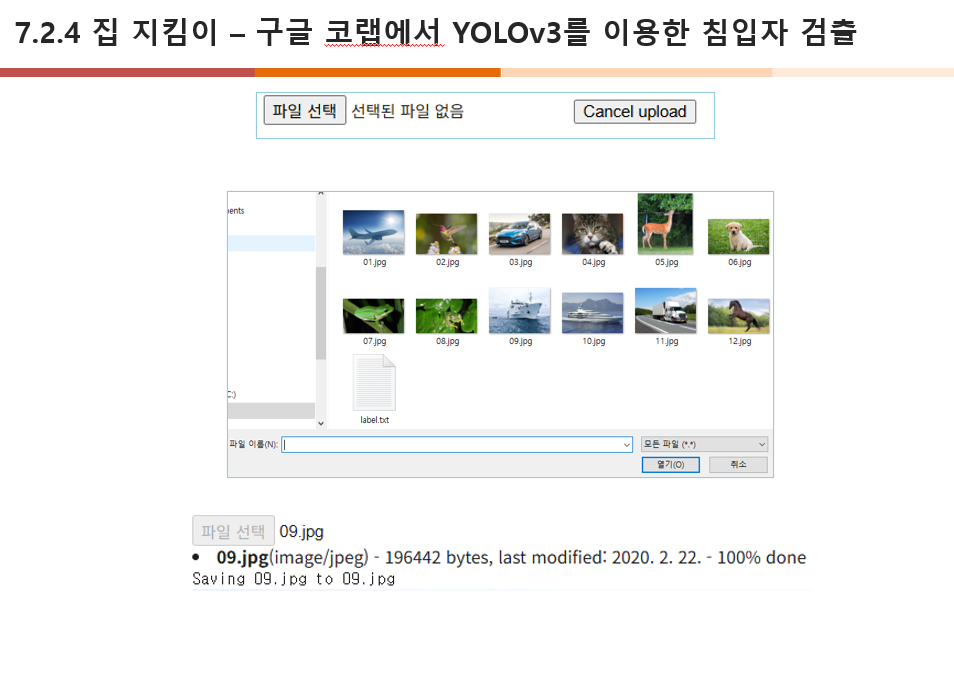

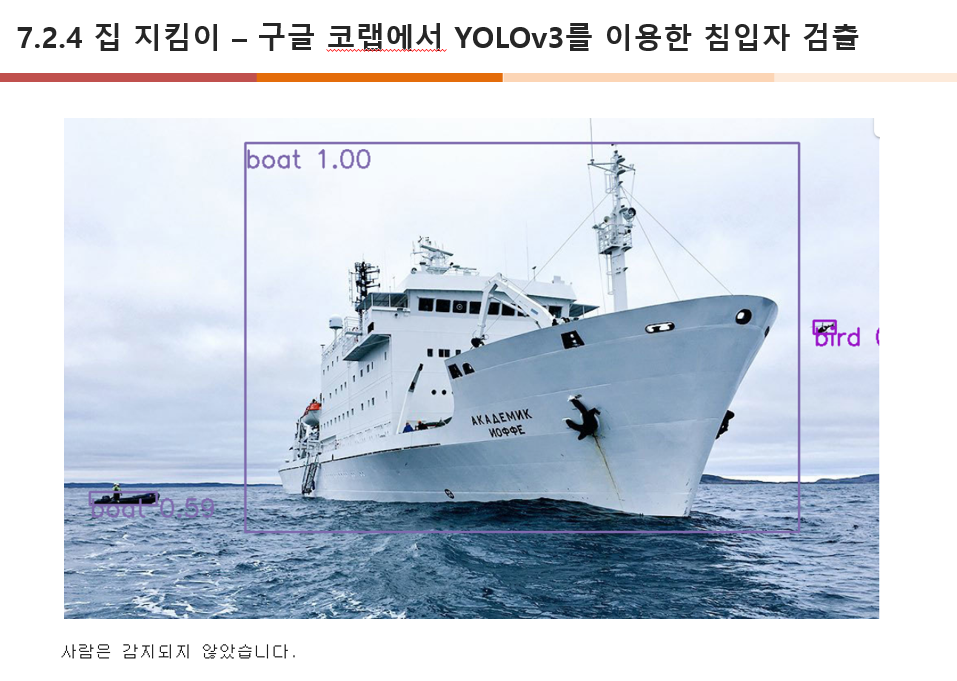

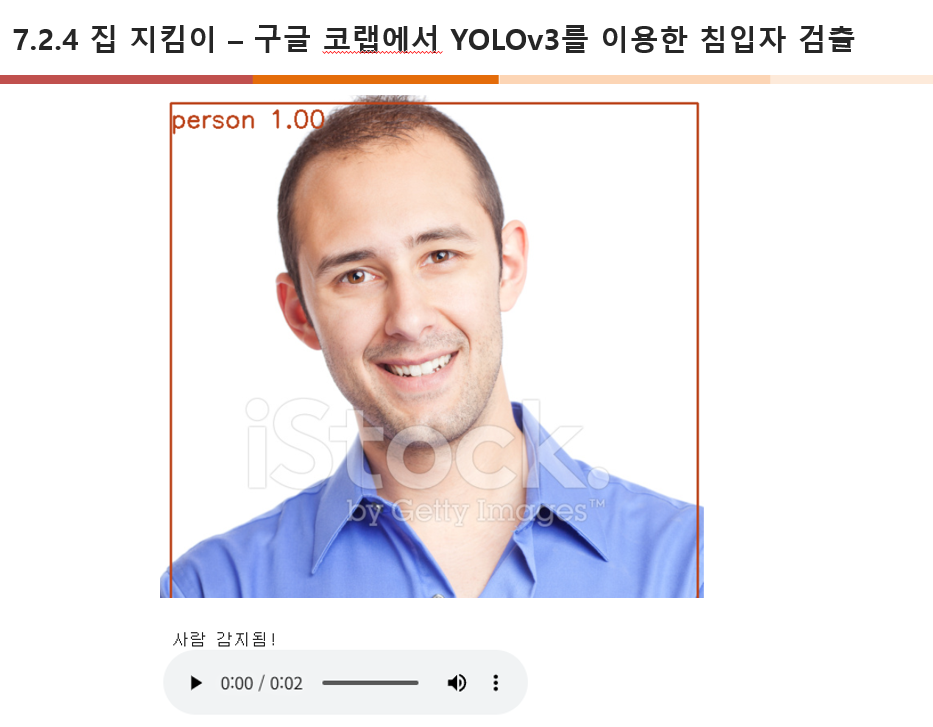